# Vector field visualization

A collection of vector field visualization techniques, each explored in its own section below.

# Van Allen belts: four ways to visualize Earth's magnetic field

This notebook compares two glyph strategies and two streamline strategies in one PyVista figure. Distances are measured in Earth radii ($R_E$). The field combines an axis-aligned dipole with a deliberately simple solar-wind distortion: the Sun is to the right ($+x$), while the magnetotail extends to the left ($-x$). This is a teaching model, not a space-weather model.

The first and third panels intentionally show common naive approaches. The second removes sampling and magnitude bias, while the fourth uses magnetically meaningful equatorial $L$-shell seeds.

In [1]:
import numpy as np
import pyvista as pv

# Client-side VTK rendering keeps the four-panel figure interactive in Jupyter.
pv.set_jupyter_backend("client")
pv.global_theme.background = "#050816"
pv.global_theme.font.color = "white"
pv.global_theme.smooth_shading = True

EARTH_RADIUS = 1.0
DOMAIN_RADIUS = 6.5


## Schematic magnetosphere model and reusable scene geometry

For a dipole moment $\mathbf m$ aligned with the $z$ axis, the undisturbed field is

$$\mathbf B(\mathbf r) \propto \frac{3\hat{\mathbf r}(\mathbf m\cdot\hat{\mathbf r})-\mathbf m}{r^3}.$$

The singular interior is masked. To make a simple magnetosphere, the dipole is smoothly compressed along $x$ on the dayside and stretched on the nightside. The field is transformed with the corresponding flux-preserving (Piola) mapping, so $\nabla\cdot\mathbf B=0$ is retained. This is still a qualitative teaching model, but it avoids introducing artificial magnetic sources or sinks. We keep both relative magnitude and a unit vector: magnitude is useful for color, while unit vectors give numerically stable integration and readable glyph lengths.

In [2]:
def reference_x(x):
    """Map physical x to the undisturbed dipole coordinate q_x."""
    x = np.asarray(x, dtype=float)
    # q_x = u(x) maps physical space back to an undisturbed dipole. Its slope
    # tends to 4/3 on the dayside (compression by 0.75) and 4/7 on the
    # nightside (stretching by 1.75), with a smooth transition near Earth.
    transition_width = 2.0
    day_slope, night_slope = 4.0 / 3.0, 4.0 / 7.0
    mean_slope = 0.5 * (day_slope + night_slope)
    half_difference = 0.5 * (day_slope - night_slope)
    scaled_x = x / transition_width
    q_x = (
        mean_slope * x
        + half_difference * transition_width * np.log(np.cosh(scaled_x))
    )
    du_dx = mean_slope + half_difference * np.tanh(scaled_x)
    return q_x, du_dx


def magnetosphere_field(points, moment=(0.0, 0.0, 1.0)):
    """Return a flux-preserving, smoothly stretched dipole field."""
    points = np.asarray(points, dtype=float)
    moment = np.asarray(moment, dtype=float)
    radius = np.linalg.norm(points, axis=1)
    x, y, z = points.T
    q_x, du_dx = reference_x(x)

    reference_points = np.column_stack((q_x, y, z))
    reference_radius = np.linalg.norm(reference_points, axis=1)
    safe_radius = np.maximum(reference_radius, EARTH_RADIUS)
    r_hat = reference_points / safe_radius[:, None]
    projection = r_hat @ moment
    reference_vectors = (
        3.0 * r_hat * projection[:, None] - moment
    ) / safe_radius[:, None] ** 3

    # Flux-preserving push-forward for q=(u(x), y, z). This coordinate
    # transformation preserves div(B)=0 when the reference dipole is solenoidal.
    vectors = reference_vectors.copy()
    vectors[:, 1] *= du_dx
    vectors[:, 2] *= du_dx
    vectors[radius <= 1.02 * EARTH_RADIUS] = 0.0
    magnitude = np.linalg.norm(vectors, axis=1)
    return vectors, magnitude


def make_field_grid(extent=DOMAIN_RADIUS, resolution=43):
    spacing = 2.0 * extent / (resolution - 1)
    grid = pv.ImageData(
        dimensions=(resolution, resolution, resolution),
        spacing=(spacing, spacing, spacing),
        origin=(-extent, -extent, -extent),
    )
    vectors, magnitude = magnetosphere_field(grid.points)
    direction = np.zeros_like(vectors)
    valid = magnitude > 0.0
    direction[valid] = vectors[valid] / magnitude[valid, None]
    grid["B"] = vectors
    grid["B_dir"] = direction
    # Relative to the undisturbed dipole strength at Earth's equator (B_eq).
    grid["Relative |B|"] = magnitude
    return grid


field_grid = make_field_grid()
# PyVista ships a globe mesh with spherical texture coordinates and a 2K
# Earth texture, so this works without downloading external assets.
earth = pv.examples.load_globe()
earth.scale(EARTH_RADIUS / 6_371_000_000.0, inplace=True)
earth_texture = pv.examples.load_globe_texture()


def add_earth(plotter):
    plotter.add_mesh(
        earth, texture=earth_texture, smooth_shading=True, specular=0.25,
        ambient=0.18, diffuse=0.85, name="Earth"
    )


def finish_panel(plotter, title):
    plotter.add_text(title, position="upper_left", font_size=18)
    plotter.set_focus((0.0, 0.0, 0.0))
    plotter.camera_position = [(10.5, -13.0, 8.0), (0.0, 0.0, 0.0), (0.0, 0.0, 1.0)]
    plotter.camera.zoom(1.15)


## Sampling strategies

A Cartesian grid over-represents empty outer space and lets strong near-Earth values dominate arrow scale. The selective sampler instead places a fixed budget of points on radial shells, so every distance range remains legible. Arrow direction, length, and color are separated deliberately.

In [3]:
def cartesian_glyph_points(extent=5.8, count=19):
    axis = np.linspace(-extent, extent, count)
    x, y, z = np.meshgrid(axis, axis, axis, indexing="ij")
    points = np.column_stack((x.ravel(), y.ravel(), z.ravel()))
    radius = np.linalg.norm(points, axis=1)
    points = points[(radius > 1.15) & (radius < extent)]
    vectors, magnitude = magnetosphere_field(points)
    cloud = pv.PolyData(points)
    cloud["B"] = vectors
    cloud["B direction"] = vectors / magnitude[:, None]
    cloud["Relative |B|"] = magnitude
    # Uniform arrow length makes this intentionally dense and cluttered.
    return cloud


def fibonacci_sphere(radius, count, phase=0.0):
    i = np.arange(count, dtype=float)
    z = 1.0 - 2.0 * (i + 0.5) / count
    azimuth = i * np.pi * (3.0 - np.sqrt(5.0)) + phase
    radial = np.sqrt(1.0 - z * z)
    return radius * np.column_stack((radial * np.cos(azimuth), radial * np.sin(azimuth), z))


def selective_glyph_points():
    radii = np.geomspace(1.25, 5.8, 8)
    points = np.vstack(
        [fibonacci_sphere(r, 56, phase=0.37 * shell) for shell, r in enumerate(radii)]
    )
    vectors, magnitude = magnetosphere_field(points)
    direction = vectors / magnitude[:, None]
    cloud = pv.PolyData(points)
    cloud["B direction"] = direction
    cloud["Relative |B|"] = magnitude
    # Bounded perceptual scaling: strong fields are visible without swallowing the scene.
    normalized = (np.log10(magnitude) - np.log10(magnitude).min()) / np.ptp(np.log10(magnitude))
    cloud["display scale"] = 0.55 + 0.65 * normalized
    return cloud


naive_cloud = cartesian_glyph_points()
smart_cloud = selective_glyph_points()
arrow = pv.Arrow(tip_length=0.28, tip_radius=0.10, shaft_radius=0.025)
naive_glyphs = naive_cloud.glyph(
    orient="B direction", scale=False, factor=0.32, geom=arrow
)
smart_glyphs = smart_cloud.glyph(
    orient="B direction", scale="display scale", factor=0.55, geom=arrow
)

In [4]:
# Naive approach: a dense, uniformly seeded equatorial plane. Many seeds are redundant,
# start inside Earth, or trace nearly identical paths.
plane = pv.Plane(
    center=(0.0, 0.0, 0.0),
    direction=(0.0, 0.0, 1.0),
    i_size=11.0,
    j_size=11.0,
    i_resolution=18,
    j_resolution=18,
)
naive_streams = field_grid.streamlines_from_source(
    plane,
    vectors="B_dir",
    integration_direction="both",
    integrator_type=45,
    initial_step_length=0.08,
    max_step_length=0.18,
    max_length=30.0,
    terminal_speed=1e-5,
)


def noon_midnight_seeds():
    """Seed matching reference dipole shells on the day and night sides."""
    reference_shells = np.geomspace(1.08, 3.8, 14)
    physical_axis = np.linspace(-DOMAIN_RADIUS, DOMAIN_RADIUS, 20_001)
    reference_axis, _ = reference_x(physical_axis)
    day_x = np.interp(reference_shells, reference_axis, physical_axis)
    night_x = np.interp(-reference_shells, reference_axis, physical_axis)
    sunward = np.column_stack((day_x, np.zeros_like(day_x), np.zeros_like(day_x)))
    tailward = np.column_stack((night_x, np.zeros_like(night_x), np.zeros_like(night_x)))
    return pv.PolyData(np.vstack((sunward, tailward)))


# A task-specific cutaway: select one physical plane instead of filling 3-D space.
smart_seeds = noon_midnight_seeds()
smart_streams = field_grid.streamlines_from_source(
    smart_seeds,
    vectors="B_dir",
    integration_direction="both",
    integrator_type=45,
    initial_step_length=0.04,
    max_step_length=0.12,
    max_length=35.0,
    terminal_speed=1e-5,
)
# Keep these as ordinary lines: selection, not tube geometry, is the improvement.


## Four-panel comparison

The same camera and spatial scale are used in all panels. The cameras are linked: drag in any panel to rotate all four together, scroll to zoom, and right-drag to pan. Color represents magnetic-field magnitude $|B|$ relative to $B_{eq}$, the undisturbed field strength at Earth's equatorial surface. Thus 1 means $B_{eq}$, 0.1 means 10% of $B_{eq}$, and 0.01 means 1%. The color mapping is logarithmic so the weak distant field remains visible; it should not be interpreted as trapped-particle density.

In [5]:
plotter = pv.Plotter(shape=(2, 2), window_size=(1600, 1200), border=True)
common_cmap = "plasma"
scalar_bar_args = {
    "title": "|B| / B_eq",
    "vertical": True, "height": 0.30, "width": 0.07,
    "title_font_size": 13, "label_font_size": 11, "fmt": "%.2g",
}

plotter.subplot(0, 0)
add_earth(plotter)
plotter.add_mesh(
    naive_glyphs, scalars="Relative |B|", cmap=common_cmap,
    clim=(5e-3, 1.8), log_scale=True, show_scalar_bar=False
)
finish_panel(plotter, "1: Dense Cartesian glyphs")

plotter.subplot(0, 1)
add_earth(plotter)
plotter.add_mesh(
    smart_glyphs, scalars="Relative |B|", cmap=common_cmap,
    clim=(5e-3, 1.8), log_scale=True, show_scalar_bar=False
)
finish_panel(plotter, "2: Selective shell-balanced glyphs")

plotter.subplot(1, 0)
add_earth(plotter)
if naive_streams.n_cells:
    plotter.add_mesh(
        naive_streams, scalars="Relative |B|", cmap=common_cmap,
        clim=(5e-3, 1.8), log_scale=True, line_width=1.0, opacity=0.72,
        show_scalar_bar=False
    )
finish_panel(plotter, "3: Exhaustive seeding (rich but crowded)")

plotter.subplot(1, 1)
add_earth(plotter)
if smart_streams.n_cells:
    plotter.add_mesh(
        smart_streams, scalars="Relative |B|", cmap=common_cmap,
        clim=(5e-3, 1.8), log_scale=True, line_width=2.0,
        scalar_bar_args=scalar_bar_args
    )
plotter.add_text("TAIL  ←    nightside | dayside    →  SUN", position="lower_left", font_size=9)
finish_panel(plotter, "4: Selective cutaway (tail topology)")

plotter.link_views()
plotter.show()

Widget(value='<iframe src="http://localhost:41709/index.html?ui=P_0x71eaede97cb0_0&reconnect=auto" class="pyvi…

# One field, four visual encodings

This standalone PyVista scene adapts the layered composition of the automotive-aerodynamics reference to the schematic Van Allen magnetic field. A scalar magnitude gradient, fine streamlines, local glyphs, and selected ribbons all describe the same underlying vector field. The rendered scene contains no explanatory labels so annotations can be added later in the presentation.

In [1]:
import numpy as np
import pyvista as pv

pv.set_jupyter_backend("client")
pv.global_theme.background = "#050816"
pv.global_theme.font.color = "white"
pv.global_theme.smooth_shading = True

EARTH_RADIUS = 1.0
DOMAIN_RADIUS = 7.0


## Schematic field

The field is a flux-preserving deformation of a dipole. It compresses the Sun-facing side ($+x$) and stretches the nightside ($-x$), retaining $\nabla\cdot\mathbf B=0$. Magnitudes are relative to the undisturbed equatorial surface field.

In [2]:
def reference_x(x):
    """Map physical x to the undisturbed dipole coordinate."""
    x = np.asarray(x, dtype=float)
    transition_width = 2.0
    day_slope, night_slope = 4.0 / 3.0, 4.0 / 7.0
    mean_slope = 0.5 * (day_slope + night_slope)
    half_difference = 0.5 * (day_slope - night_slope)
    scaled_x = x / transition_width
    q_x = (
        mean_slope * x
        + half_difference * transition_width * np.log(np.cosh(scaled_x))
    )
    du_dx = mean_slope + half_difference * np.tanh(scaled_x)
    return q_x, du_dx


def magnetosphere_field(points, moment=(0.0, 0.0, 1.0)):
    """Return the stretched dipole vectors and relative magnitudes."""
    points = np.asarray(points, dtype=float)
    moment = np.asarray(moment, dtype=float)
    physical_radius = np.linalg.norm(points, axis=1)
    x, y, z = points.T
    q_x, du_dx = reference_x(x)
    reference_points = np.column_stack((q_x, y, z))
    reference_radius = np.linalg.norm(reference_points, axis=1)
    safe_radius = np.maximum(reference_radius, EARTH_RADIUS)
    r_hat = reference_points / safe_radius[:, None]
    projection = r_hat @ moment
    reference_vectors = (
        3.0 * r_hat * projection[:, None] - moment
    ) / safe_radius[:, None] ** 3

    vectors = reference_vectors.copy()
    vectors[:, 1] *= du_dx
    vectors[:, 2] *= du_dx
    vectors[physical_radius <= 1.02 * EARTH_RADIUS] = 0.0
    magnitude = np.linalg.norm(vectors, axis=1)
    return vectors, magnitude


def make_field_grid(extent=DOMAIN_RADIUS, resolution=51):
    spacing = 2.0 * extent / (resolution - 1)
    grid = pv.ImageData(
        dimensions=(resolution, resolution, resolution),
        spacing=(spacing, spacing, spacing),
        origin=(-extent, -extent, -extent),
    )
    vectors, magnitude = magnetosphere_field(grid.points)
    direction = np.zeros_like(vectors)
    valid = magnitude > 0.0
    direction[valid] = vectors[valid] / magnitude[valid, None]
    grid["B"] = vectors
    grid["B direction"] = direction
    grid["Relative |B|"] = magnitude
    return grid


field_grid = make_field_grid()

earth = pv.examples.load_globe()
earth.scale(EARTH_RADIUS / 6_371_000_000.0, inplace=True)
earth_texture = pv.examples.load_globe_texture()

## Build the four encodings

The encodings occupy four exclusive spatial zones around Earth. The scalar gradient is cropped to a left-hand patch, streamlines appear only above Earth, glyphs occupy a right-hand patch, and ribbons appear only below Earth. Small gaps between the zones prevent the techniques from covering one another.

In [3]:
# 1. Scalar magnitude gradient on a cropped left-hand plane patch.
slice_x = np.linspace(-7.0, -1.35, 121)
slice_z = np.linspace(-0.68, 0.68, 61)
xx, zz = np.meshgrid(slice_x, slice_z, indexing="ij")
yy = np.full_like(xx, 1.25)
scalar_slice = pv.StructuredGrid(xx, yy, zz)
_, slice_magnitude = magnetosphere_field(scalar_slice.points)
scalar_slice["Relative |B|"] = np.maximum(slice_magnitude, 5e-3)


# 2. Fine streamlines in the noon-midnight plane, cropped to the upper zone.
stream_x = np.concatenate(
    (-np.linspace(3.0, 6.2, 13), np.linspace(2.0, 5.3, 15))
)
stream_seeds = pv.PolyData(
    np.column_stack((stream_x, np.zeros_like(stream_x), np.zeros_like(stream_x)))
)
all_streams = field_grid.streamlines_from_source(
    stream_seeds,
    vectors="B direction",
    integration_direction="both",
    integrator_type=45,
    initial_step_length=0.035,
    max_step_length=0.10,
    max_length=35.0,
    terminal_speed=1e-5,
)
fine_streams = all_streams.clip(
    normal=(0.0, 0.0, 1.0), origin=(0.0, 0.0, 0.78), invert=False
)


# 3. Local arrow glyphs on a cropped right-hand foreground patch.
glyph_x = np.linspace(1.35, 5.8, 11)
glyph_z = np.linspace(-0.65, 0.65, 7)
gx, gz = np.meshgrid(glyph_x, glyph_z, indexing="ij")
glyph_points = np.column_stack(
    (gx.ravel(), np.full(gx.size, -0.75), gz.ravel())
)
glyph_radius = np.linalg.norm(glyph_points, axis=1)
glyph_points = glyph_points[(glyph_radius > 1.35) & (glyph_radius < 6.1)]
glyph_vectors, glyph_magnitude = magnetosphere_field(glyph_points)
glyph_direction = glyph_vectors / glyph_magnitude[:, None]
glyph_cloud = pv.PolyData(glyph_points)
glyph_cloud["B direction"] = glyph_direction
glyph_cloud["Relative |B|"] = glyph_magnitude
arrow = pv.Arrow(tip_length=0.30, tip_radius=0.11, shaft_radius=0.028)
glyphs = glyph_cloud.glyph(
    orient="B direction", scale=False, factor=0.38, geom=arrow
)


# 4. Selected field lines widened into ribbons, cropped to the lower zone.
ribbon_x = np.array([-6.0, -5.2, -4.5, -3.8, 2.4, 3.1, 3.8, 4.6])
ribbon_seeds = pv.PolyData(
    np.column_stack((ribbon_x, np.zeros_like(ribbon_x), np.zeros_like(ribbon_x)))
)
all_ribbon_lines = field_grid.streamlines_from_source(
    ribbon_seeds,
    vectors="B direction",
    integration_direction="both",
    integrator_type=45,
    initial_step_length=0.03,
    max_step_length=0.08,
    max_length=35.0,
    terminal_speed=1e-5,
)
ribbon_lines = all_ribbon_lines.clip(
    normal=(0.0, 0.0, 1.0), origin=(0.0, 0.0, -0.78), invert=True
)
ribbons = ribbon_lines.ribbon(width=0.14, normal=(0.0, 1.0, 0.0))

## Combined presentation scene

Drag to rotate, scroll to zoom, and right-drag to pan. The scalar bar and method labels are intentionally omitted from the rendered scene.

In [4]:
plotter = pv.Plotter(window_size=(1500, 900))

# Color-only magnitude-gradient layer.
plotter.add_mesh(
    scalar_slice,
    scalars="Relative |B|",
    cmap="viridis",
    clim=(5e-3, 1.2),
    log_scale=True,
    opacity=0.82,
    lighting=False,
    show_scalar_bar=False,
)

# Fine streamline layer.
if fine_streams.n_cells:
    plotter.add_mesh(
        fine_streams, color="#67d5ff", line_width=1.8, opacity=0.90
    )

# Foreground glyph layer.
plotter.add_mesh(
    glyphs,
    scalars="Relative |B|",
    cmap="autumn",
    clim=(5e-3, 1.2),
    log_scale=True,
    show_scalar_bar=False,
)

# Bold selected ribbons.
if ribbons.n_cells:
    plotter.add_mesh(
        ribbons, color="#ff3d6e", smooth_shading=True,
        specular=0.35, opacity=1.0
    )

# Earth is added last as the visual anchor.
plotter.add_mesh(
    earth, texture=earth_texture, smooth_shading=True,
    ambient=0.20, diffuse=0.85, specular=0.25
)

plotter.camera_position = [
    (1.0, -19.0, 4.5),
    (-0.35, 0.0, 0.0),
    (0.0, 0.0, 1.0),
]
plotter.camera.zoom(1.30)
plotter.show()

Widget(value='<iframe src="http://localhost:46831/index.html?ui=P_0x78ec55c17cb0_0&reconnect=auto" class="pyvi…

## Magnitude on one complete plane

This view shows only relative field strength on the noon-midnight plane. Color is mapped logarithmically so both the strong near-Earth field and the weak distant field remain visible.

In [8]:
magnitude_bar_args = {
    "title": "|B| / B_eq",
    "vertical": True,
    "position_x": 0.86,
    "position_y": 0.25,
    "height": 0.46,
    "width": 0.055,
    "title_font_size": 15,
    "label_font_size": 12,
    "fmt": "%.2g",
}

one_slice = field_grid.slice(normal=(0.0, 1.0, 0.0), origin=(0.0, 0.15, 0.0))

one_slice_plotter = pv.Plotter(window_size=(1500, 900))
one_slice_plotter.add_mesh(
    one_slice,
    scalars="Relative |B|",
    cmap="viridis",
    clim=(5e-3, 1.2),
    log_scale=True,
    lighting=False,
    scalar_bar_args=magnitude_bar_args,
)
one_slice_plotter.add_mesh(
    earth, texture=earth_texture, smooth_shading=True,
    ambient=0.20, diffuse=0.85, specular=0.25,
)
one_slice_plotter.add_text(
    "Relative magnetic-field strength on one plane",
    position="upper_left", font_size=18,
)
one_slice_plotter.camera_position = [
    (0.0, -22.0, 0.0),
    (0.0, 0.0, 0.0),
    (0.0, 0.0, 1.0),
]
one_slice_plotter.enable_parallel_projection()
one_slice_plotter.show()

Widget(value='<iframe src="http://localhost:46831/index.html?ui=P_0x78ec4025e990_4&reconnect=auto" class="pyvi…

## Two orthogonal magnitude slices

A second, perpendicular plane adds depth context without attempting to display the entire volume. Both planes use exactly the same color range.

In [9]:
noon_midnight_slice = field_grid.slice(
    normal=(0.0, 1.0, 0.0), origin=(0.0, 0.15, 0.0)
)
cross_tail_slice = field_grid.slice(
    normal=(1.0, 0.0, 0.0), origin=(0.15, 0.0, 0.0)
)

two_slice_plotter = pv.Plotter(window_size=(1500, 900))
two_slice_plotter.add_mesh(
    noon_midnight_slice,
    scalars="Relative |B|",
    cmap="viridis",
    clim=(5e-3, 1.2),
    log_scale=True,
    opacity=0.88,
    lighting=False,
    scalar_bar_args=magnitude_bar_args,
)
two_slice_plotter.add_mesh(
    cross_tail_slice,
    scalars="Relative |B|",
    cmap="viridis",
    clim=(5e-3, 1.2),
    log_scale=True,
    opacity=0.88,
    lighting=False,
    show_scalar_bar=False,
)
two_slice_plotter.add_mesh(
    earth, texture=earth_texture, smooth_shading=True,
    ambient=0.20, diffuse=0.85, specular=0.25,
)
two_slice_plotter.add_text(
    "Relative magnetic-field strength on two orthogonal planes",
    position="upper_left", font_size=18,
)
two_slice_plotter.camera_position = [
    (11.0, -15.5, 8.5),
    (0.0, 0.0, 0.0),
    (0.0, 0.0, 1.0),
]
two_slice_plotter.camera.zoom(1.15)
two_slice_plotter.show()

Widget(value='<iframe src="http://localhost:46831/index.html?ui=P_0x78ec17110b90_5&reconnect=auto" class="pyvi…

## Translucent 3D magnitude volume

Yes, the complete 3D field can be volume-rendered. Low values are made nearly transparent and stronger regions progressively more opaque. This reveals the overall strength distribution, although internal values remain harder to read precisely than in a slice.

In [7]:
volume_grid = field_grid.copy()
volume_strength = np.asarray(volume_grid["Relative |B|"]).copy()
volume_radius = np.linalg.norm(volume_grid.points, axis=1)
# Keep a transparent cavity around Earth so the globe remains visible.
volume_strength[volume_radius < 1.45] = 0.0
volume_grid["Volume log strength"] = np.log10(
    np.maximum(volume_strength, 5e-3)
)

opacity = np.interp(
    np.linspace(0.0, 1.0, 256),
    [0.0, 0.15, 0.32, 0.52, 0.75, 1.0],
    [0, 0, 4, 14, 46, 133],  # PyVista volume opacity uses 0..255.
)

volume_plotter = pv.Plotter(window_size=(1500, 900))
volume_plotter.add_volume(
    volume_grid,
    scalars="Volume log strength",
    cmap="plasma",
    clim=(-2.3, 0.08),
    opacity=opacity,
    blending="composite",
    shade=False,
    ambient=0.25,
    diffuse=0.70,
    specular=0.20,
    show_scalar_bar=False,
)
volume_plotter.add_mesh(
    earth, texture=earth_texture, smooth_shading=True,
    ambient=0.25, diffuse=0.85, specular=0.25,
)
volume_plotter.add_text(
    "Translucent 3D field-strength volume",
    position="upper_left", font_size=18,
)
volume_plotter.camera_position = [
    (11.0, -15.5, 8.5),
    (-0.4, 0.0, 0.0),
    (0.0, 0.0, 1.0),
]
volume_plotter.camera.zoom(1.50)
volume_plotter.show()

Widget(value='<iframe src="http://localhost:46831/index.html?ui=P_0x78ec17110e10_3&reconnect=auto" class="pyvi…

# Tornado wind field: vectors converted to scalars

A synthetic tornado provides a compact example of deriving a scalar quantity from a 3D vector field. The underlying data is wind velocity, and the derived scalar is wind-speed magnitude.

This is a qualitative teaching model, not a weather simulation. Coordinates are in kilometers and velocity is in meters per second.

In [1]:
import numpy as np
import pyvista as pv

pv.set_jupyter_backend("client")
pv.global_theme.background = "#050816"
pv.global_theme.font.color = "white"
pv.global_theme.smooth_shading = True


## Synthetic 3D tornado

The model combines tangential rotation, radial inflow, and a central updraft. Its core widens with altitude and bends slightly, producing a recognizable funnel while remaining inexpensive to compute.

In [2]:
NX, NY, NZ = 73, 73, 65
X_LIMIT, Y_LIMIT, Z_LIMIT = 6.0, 6.0, 10.0

wind_grid = pv.ImageData(
    dimensions=(NX, NY, NZ),
    spacing=(
        2.0 * X_LIMIT / (NX - 1),
        2.0 * Y_LIMIT / (NY - 1),
        Z_LIMIT / (NZ - 1),
    ),
    origin=(-X_LIMIT, -Y_LIMIT, 0.0),
)

x, y, z = wind_grid.points.T
center_x = 0.28 * np.sin(0.62 * z)
center_y = 0.20 * np.sin(0.41 * z + 0.8)
dx = x - center_x
dy = y - center_y
radius = np.sqrt(dx**2 + dy**2)
safe_radius = np.maximum(radius, 1e-8)

core_radius = 0.38 + 0.145 * z
normalized_radius = radius / core_radius
ground_ramp = 1.0 - np.exp(-z / 0.45)
tangential_speed = (
    72.0
    * normalized_radius
    * np.exp(0.5 * (1.0 - normalized_radius**2))
    * ground_ramp
)
radial_speed = (
    -20.0
    * normalized_radius
    * np.exp(-0.55 * normalized_radius**2)
    * ground_ramp
)
vertical_speed = (
    30.0
    * np.exp(-(radius / (1.35 * core_radius)) ** 2)
    * (0.65 + 0.35 * z / Z_LIMIT)
)

radial_x = dx / safe_radius
radial_y = dy / safe_radius
wind = np.column_stack(
    (
        radial_speed * radial_x - tangential_speed * radial_y,
        radial_speed * radial_y + tangential_speed * radial_x,
        vertical_speed,
    )
)
wind_speed = np.linalg.norm(wind, axis=1)
wind_direction = np.zeros_like(wind)
moving = wind_speed > 1e-8
wind_direction[moving] = wind[moving] / wind_speed[moving, None]

wind_grid["Wind velocity"] = wind
wind_grid["Wind direction"] = wind_direction
wind_grid["Wind speed"] = wind_speed

print(f"Maximum wind speed: {wind_speed.max():.1f} m/s")

Maximum wind speed: 75.0 m/s


## Start with the vector field

Streamlines reveal the rotating, rising trajectories without additional geometry competing for attention.

In [3]:
seed_points = []
for seed_radius in np.linspace(0.55, 4.8, 11):
    for angle in np.linspace(0.0, 2.0 * np.pi, 9, endpoint=False):
        seed_points.append(
            (seed_radius * np.cos(angle), seed_radius * np.sin(angle), 0.18)
        )
stream_seeds = pv.PolyData(np.asarray(seed_points))
tornado_streams = wind_grid.streamlines_from_source(
    stream_seeds,
    vectors="Wind direction",
    integration_direction="forward",
    integrator_type=45,
    initial_step_length=0.04,
    max_step_length=0.10,
    max_length=45.0,
    terminal_speed=1e-5,
)

ground = pv.Plane(
    center=(0.0, 0.0, 0.0), direction=(0.0, 0.0, 1.0),
    i_size=12.0, j_size=12.0, i_resolution=12, j_resolution=12,
)

overview = pv.Plotter(window_size=(1500, 900))
overview.set_background("black")
overview.add_mesh(
    tornado_streams, scalars="Wind speed", cmap="turbo",
    clim=(0.0, 80.0), line_width=1.7, show_scalar_bar=False,
)
overview.add_text(
    "3D tornado wind vector field", position="upper_left",
    font_size=18, color="white",
)
overview.camera_position = [(11.5, -15.0, 9.0), (0.0, 0.0, 4.0), (0.0, 0.0, 1.0)]
overview.camera.zoom(1.18)
overview.show()

Widget(value='<iframe src="http://localhost:38903/index.html?ui=P_0x75a19c09fb60_0&reconnect=auto" class="pyvi…

## Two individual orthogonal views

Taking $|\mathbf v|$ converts the vector field into the scalar wind speed. The first panel looks straight down on one horizontal plane; the second looks straight at one vertical plane. A compact locator shows how those planes sit inside the 3D domain.

In [4]:
speed_bar = {
    "title": "Wind speed (m/s)",
    "vertical": True, "position_x": 0.86, "position_y": 0.22,
    "height": 0.50, "width": 0.055,
    "title_font_size": 15, "label_font_size": 12, "fmt": "%.0f",
}
horizontal_speed = wind_grid.slice(
    normal=(0.0, 0.0, 1.0), origin=(0.0, 0.0, 0.75)
)
vertical_speed = wind_grid.slice(
    normal=(0.0, 1.0, 0.0), origin=(0.0, 0.0, 0.0)
)

one_slice = pv.Plotter(
    shape=(1, 2), window_size=(1600, 760), border=True,
)

one_slice.subplot(0, 0)
one_slice.add_mesh(
    horizontal_speed, scalars="Wind speed", cmap="turbo",
    clim=(0.0, 80.0), lighting=False, scalar_bar_args=speed_bar,
)
one_slice.add_text("Horizontal slice", position="upper_left", font_size=17)
one_slice.camera_position = [(0.0, 0.0, 24.0), (0.0, 0.0, 0.75), (0.0, 1.0, 0.0)]
one_slice.enable_parallel_projection()

one_slice.subplot(0, 1)
one_slice.add_mesh(
    vertical_speed, scalars="Wind speed", cmap="turbo",
    clim=(0.0, 80.0), lighting=False, show_scalar_bar=False,
)
one_slice.add_text("Vertical slice", position="upper_left", font_size=17)
one_slice.camera_position = [(0.0, -24.0, 5.0), (0.0, 0.0, 5.0), (0.0, 0.0, 1.0)]
one_slice.enable_parallel_projection()

# Add a small independent renderer as an inset in the lower-left corner
# of the horizontal panel. Viewport coordinates refer to the full window.
domain_box = pv.Box(bounds=wind_grid.bounds)
inset = pv.Renderer(one_slice, border=True, border_color="white", border_width=2.0)
inset.SetViewport(0.015, 0.035, 0.195, 0.285)
inset.set_background("#101421")
one_slice.render_window.AddRenderer(inset)

def add_inset_actor(renderer, mesh, color, opacity=1.0, wireframe=False):
    mapper = pv.DataSetMapper(dataset=mesh)
    actor = pv.Actor(mapper=mapper)
    actor.prop.color = color
    actor.prop.opacity = opacity
    actor.prop.show_edges = False
    actor.prop.lighting = False
    if wireframe:
        actor.prop.style = "wireframe"
        actor.prop.line_width = 2.0
    renderer.add_actor(actor, reset_camera=False)


add_inset_actor(inset, domain_box, "white", wireframe=True)
add_inset_actor(inset, horizontal_speed, "#00f5ff", opacity=0.95)
add_inset_actor(inset, vertical_speed, "#ffd60a", opacity=0.95)
inset.camera_position = [(24.0, -30.0, 20.0), (0.0, 0.0, 4.5), (0.0, 0.0, 1.0)]
inset.camera.zoom(0.78)
one_slice.show()

Widget(value='<iframe src="http://localhost:38903/index.html?ui=P_0x75a1272a8050_1&reconnect=auto" class="pyvi…

## Magnitude on two orthogonal planes

Two vertical slices expose how wind speed changes with both altitude and horizontal position while retaining an understandable spatial frame. The inset repeats their locations inside the full domain.

In [5]:
speed_xz = wind_grid.slice(normal=(0.0, 1.0, 0.0), origin=(0.0, 0.0, 0.0))
speed_yz = wind_grid.slice(normal=(1.0, 0.0, 0.0), origin=(0.0, 0.0, 0.0))

two_slices = pv.Plotter(window_size=(1500, 900))
two_slices.add_mesh(
    speed_xz, scalars="Wind speed", cmap="turbo", clim=(0.0, 80.0),
    lighting=False, opacity=0.92, scalar_bar_args=speed_bar,
)
two_slices.add_mesh(
    speed_yz, scalars="Wind speed", cmap="turbo", clim=(0.0, 80.0),
    lighting=False, opacity=0.92, show_scalar_bar=False,
)
two_slices.add_mesh(ground, color="#20283b", opacity=0.35)
two_slices.add_text("Wind-speed magnitude on two orthogonal planes", position="upper_left", font_size=28)
two_slices.camera_position = [(12.5, -16.0, 10.0), (0.0, 0.0, 4.5), (0.0, 0.0, 1.0)]
two_slices.camera.zoom(1.18)

# Repeat the bright slice-location diagram as an inset in this 3D view.
combined_locator = pv.Renderer(
    two_slices, border=True, border_color="white", border_width=2.0
)
combined_locator.SetViewport(0.02, 0.035, 0.20, 0.285)
combined_locator.set_background("#101421")
two_slices.render_window.AddRenderer(combined_locator)
add_inset_actor(combined_locator, domain_box, "white", wireframe=True)
add_inset_actor(combined_locator, speed_xz, "#00f5ff", opacity=0.95)
add_inset_actor(combined_locator, speed_yz, "#ffd60a", opacity=0.95)
combined_locator.camera_position = [
    (24.0, -30.0, 20.0), (0.0, 0.0, 4.5), (0.0, 0.0, 1.0)
]
combined_locator.camera.zoom(0.78)
two_slices.show()

Widget(value='<iframe src="http://localhost:38903/index.html?ui=P_0x75a1272a82d0_2&reconnect=auto" class="pyvi…

# Glyphs for a synthetic pulsatile aneurysm flow

A presentation-oriented comparison of line glyphs, arrows, sampling density, size scaling, and time. The flow is synthetic and illustrative, not a medical simulation.

In [1]:
import numpy as np
import pyvista as pv

pv.set_jupyter_backend("client")
pv.global_theme.background = "black"
pv.global_theme.font.color = "white"
pv.global_theme.font.family = "arial"
pv.global_theme.font.size = 18

CMAP = "turbo"
CLIM = (0.0, 1.7)
CAMERA = [(10.5, -14.0, 7.5), (0.0, 0.0, 0.0), (0.0, 0.0, 1.0)]
SCALAR_BAR = {
    "title": "Relative speed", "vertical": True,
    "position_x": 0.86, "position_y": 0.22,
    "height": 0.50, "width": 0.055,
    "title_font_size": 19, "label_font_size": 16, "fmt": "%.1f",
    "color": "white",
}


## Illustrative model

The vessel runs along the x-axis and widens into an aneurysm. The synthetic field combines forward flow with recirculation inside the widened region. A heartbeat phase controls its strength.

In [2]:
def vessel_radius(x):
    return 0.82 + 1.28 * np.exp(-(x / 2.15) ** 2)


# Vessel wall
wall_x = np.linspace(-6.5, 6.5, 121)
wall_theta = np.linspace(0.0, 2.0 * np.pi, 72)
XW, TW = np.meshgrid(wall_x, wall_theta, indexing="ij")
RW = vessel_radius(XW)
YW = RW * np.cos(TW)
ZW = RW * np.sin(TW)
vessel_wall = pv.StructuredGrid(XW, YW, ZW).extract_surface(
    algorithm="dataset_surface"
)

# Candidate points throughout the vessel volume
gx = np.linspace(-6.1, 6.1, 43)
gy = np.linspace(-2.0, 2.0, 19)
gz = np.linspace(-2.0, 2.0, 19)
X, Y, Z = np.meshgrid(gx, gy, gz, indexing="ij")
candidate_points = np.column_stack((X.ravel(), Y.ravel(), Z.ravel()))
inside = np.hypot(candidate_points[:, 1], candidate_points[:, 2]) < (
    0.91 * vessel_radius(candidate_points[:, 0])
)
sample_points = candidate_points[inside]


def velocity_at_points(points, phase):
    """Evaluate the illustrative velocity model at arbitrary points."""
    x, y, z = points.T
    radius = vessel_radius(x)
    radial_fraction = np.hypot(y, z) / radius
    profile = np.clip(1.0 - radial_fraction**2, 0.0, None)
    bulge = np.exp(-(x / 2.25) ** 2)
    pulse = 0.35 + 0.65 * (0.5 + 0.5 * np.sin(phase))

    # Forward flow plus a vortex in the widened region.
    axial = (0.20 + 1.18 * pulse) * profile * (1.0 - 0.28 * bulge)
    vortex = (0.35 + 0.58 * pulse) * bulge * profile
    vx = axial - 0.95 * vortex * z / radius
    vy = -0.18 * vortex * z / radius
    vz = 0.72 * vortex * x / 2.25 + 0.18 * vortex * y / radius

    velocity = np.column_stack((vx, vy, vz))
    velocity[np.hypot(y, z) >= 0.98 * radius] = 0.0
    return velocity


def flow_at_phase(phase):
    """Return the pulsatile velocity field on the glyph sample points."""
    velocity = velocity_at_points(sample_points, phase)
    speed = np.linalg.norm(velocity, axis=1)
    data = pv.PolyData(sample_points)
    data["Velocity"] = velocity
    data["Speed"] = speed
    return data


peak_flow = flow_at_phase(0.5 * np.pi)
rng = np.random.default_rng(12)
point_order = rng.permutation(peak_flow.n_points)
sparse_ids = point_order[:70]
balanced_ids = point_order[:210]
dense_ids = point_order[:650]


def subset(data, ids):
    selected = pv.PolyData(data.points[ids])
    selected["Velocity"] = data["Velocity"][ids]
    selected["Speed"] = data["Speed"][ids]
    return selected


def line_glyphs(data, ids, length=0.62):
    selected = subset(data, ids)
    velocity = selected["Velocity"]
    speed = selected["Speed"]
    direction = velocity / np.maximum(speed[:, None], 1e-12)
    starts = selected.points - 0.5 * length * direction
    ends = selected.points + 0.5 * length * direction
    segment_points = np.empty((2 * len(ids), 3))
    segment_points[0::2] = starts
    segment_points[1::2] = ends
    connectivity = np.column_stack((
        np.full(len(ids), 2), np.arange(2 * len(ids)).reshape(-1, 2)
    )).ravel()
    lines = pv.PolyData(segment_points, lines=connectivity)
    lines["Speed"] = np.repeat(speed, 2)
    return lines


arrow_source = pv.Arrow(tip_length=0.28, tip_radius=0.11, shaft_radius=0.035)


def arrow_glyphs(data, ids, factor=0.68, scale=False):
    selected = subset(data, ids)
    return selected.glyph(
        orient="Velocity", scale=scale, factor=factor, geom=arrow_source, tolerance=0.0
    )


def add_context(
    plotter, background="black", wall_color="#b9c2cc", wall_opacity=0.16
):
    plotter.set_background(background)
    plotter.add_mesh(
        vessel_wall, color=wall_color, opacity=wall_opacity,
        smooth_shading=True, show_scalar_bar=False,
    )
    plotter.camera_position = CAMERA
    plotter.camera.zoom(1.12)


TITLE_FONT_SIZE = 28


def add_title(plotter, text, color="white"):
    plotter.add_text(
        text, position="upper_left", font_size=TITLE_FONT_SIZE, color=color
    )


## Blood-flow illustration

Red streamlines provide an intuitive opening view of blood moving through the widened vessel. Their red gradient adds depth without introducing a legend or competing with the later glyph comparison.

In [3]:
# A regular volume is used only to integrate the illustrative streamlines.
flow_volume = pv.StructuredGrid(X, Y, Z)
flow_volume["Velocity"] = velocity_at_points(
    flow_volume.points, phase=0.5 * np.pi
)

seed_radii = [0.10, 0.28, 0.46, 0.64]
seed_counts = [5, 9, 13, 17]
seed_points = []
for radius, count in zip(seed_radii, seed_counts):
    angles = np.linspace(0.0, 2.0 * np.pi, count, endpoint=False)
    seed_points.extend(
        np.column_stack((
            np.full(count, -5.85),
            radius * np.cos(angles),
            radius * np.sin(angles),
        ))
    )
seed_cloud = pv.PolyData(np.vstack(seed_points))
blood_streamlines = flow_volume.streamlines_from_source(
    seed_cloud, vectors="Velocity", integration_direction="forward",
    initial_step_length=0.05, max_step_length=0.12,
    max_steps=5000, max_length=20.0, terminal_speed=1e-4,
    compute_vorticity=False,
)

flow_illustration = pv.Plotter(window_size=(1500, 850))
add_context(
    flow_illustration, background="black",
    wall_color="#87919c", wall_opacity=0.18,
)
blood_streamlines["Stream speed"] = np.linalg.norm(
    blood_streamlines["Velocity"], axis=1
)
flow_illustration.add_mesh(
    blood_streamlines, scalars="Stream speed",
    cmap=["#5c0000", "#c1121f", "#ff3b30", "#ffb3ad"],
    clim=CLIM, line_width=3.2, lighting=False,
    render_lines_as_tubes=False, show_scalar_bar=False,
)
add_title(flow_illustration, "Blood flow through a synthetic aneurysm")
flow_illustration.show()

Widget(value='<iframe src="http://localhost:43859/index.html?ui=P_0x7177981bbe00_0&reconnect=auto" class="pyvi…

## 1. Line glyphs: orientation without direction

Short lines reveal local alignment and preserve a light visual texture. Their symmetry makes the sign ambiguous: either end could be downstream.

In [4]:
line_plot = pv.Plotter(window_size=(1500, 850))
add_context(line_plot)
line_plot.add_mesh(
    line_glyphs(peak_flow, balanced_ids), scalars="Speed", cmap=CMAP, clim=CLIM,
    line_width=4, lighting=False, scalar_bar_args=SCALAR_BAR,
)
add_title(line_plot, "Lines show orientation, but not flow direction")
line_plot.show()

Widget(value='<iframe src="http://localhost:43859/index.html?ui=P_0x717719dc0050_1&reconnect=auto" class="pyvi…

## 2. Arrow glyphs: direction becomes explicit

Arrowheads resolve the ambiguity, at the cost of more visual ink. Color still carries speed; arrow length is fixed here so it does not duplicate the color encoding.

In [5]:
arrow_plot = pv.Plotter(window_size=(1500, 850))
add_context(arrow_plot)
arrow_plot.add_mesh(
    arrow_glyphs(peak_flow, balanced_ids), scalars="Speed", cmap=CMAP, clim=CLIM,
    smooth_shading=True, show_scalar_bar=False,
)
add_title(arrow_plot, "Arrowheads make direction explicit")
arrow_plot.show()

Widget(value='<iframe src="http://localhost:43859/index.html?ui=P_0x7176f27e6710_2&reconnect=auto" class="pyvi…

## 3. Scaled glyphs with dense sampling

Scaling arrows by speed adds a second magnitude cue, but combining it with dense sampling creates overlap and hides the underlying flow structure.

In [6]:
messy_data = subset(peak_flow, dense_ids)
messy_data["Glyph size"] = messy_data["Speed"]
messy_arrows = messy_data.glyph(
    orient="Velocity", scale="Glyph size", factor=1.55,
    geom=arrow_source, tolerance=0.0,
)

dense_plot = pv.Plotter(window_size=(1500, 850))
add_context(dense_plot)
dense_plot.add_mesh(
    messy_arrows, scalars="Speed", cmap=CMAP, clim=CLIM,
    smooth_shading=True, show_scalar_bar=False,
)
add_title(dense_plot, "Scaled glyphs + Dense sampling")
dense_plot.show()

Widget(value='<iframe src="http://localhost:43859/index.html?ui=P_0x7176dc3e8690_3&reconnect=auto" class="pyvi…

## 4. Temporal flow

A single animated view follows the same field through one heartbeat. Glyph positions and the color scale remain fixed while arrow direction, color, and length update continuously. The cell writes a looping GIF and displays it inline.

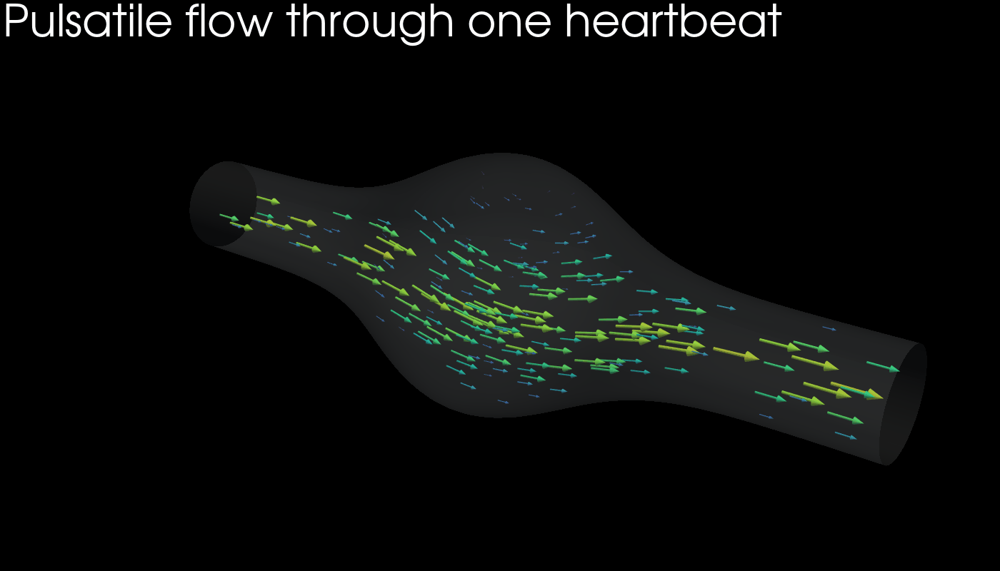

In [7]:
from pathlib import Path
from IPython.display import Image, display

GIF_PATH = Path("aneurysm_temporal_flow.gif")
N_FRAMES = 56

time_plot = pv.Plotter(off_screen=True, window_size=(1400, 800))
add_context(time_plot)
def temporal_arrows(phase):
    frame_data = subset(flow_at_phase(phase), balanced_ids)
    frame_data["Temporal size"] = np.clip(
        frame_data["Speed"] / 1.25, 0.10, 1.15
    )
    return frame_data.glyph(
        orient="Velocity", scale="Temporal size", factor=0.90,
        geom=arrow_source, tolerance=0.0,
    )


animated_arrows = temporal_arrows(0.0)
arrow_actor = time_plot.add_mesh(
    animated_arrows, scalars="Speed", cmap=CMAP, clim=CLIM,
    smooth_shading=True, show_scalar_bar=False,
)
add_title(time_plot, "Pulsatile flow through one heartbeat")
time_plot.open_gif(GIF_PATH, fps=16, loop=0)

# Include the endpoint so the last and first frames meet smoothly.
for phase in np.linspace(0.0, 2.0 * np.pi, N_FRAMES, endpoint=True):
    next_arrows = temporal_arrows(phase)
    # Assigning a new dataset and explicitly rendering forces every GIF frame
    # to receive the updated geometry, rather than repeating frame zero.
    arrow_actor.mapper.dataset = next_arrows
    arrow_actor.mapper.scalar_range = CLIM
    time_plot.render()
    time_plot.write_frame()

time_plot.close()
display(Image(filename=str(GIF_PATH)))

# Points to vectors: from a point cloud to glyphs

A minimal example of turning a plain point cloud into a vector field visualization by attaching direction, magnitude, and color to each point.

In [1]:
import numpy as np
import pyvista as pv

pv.set_jupyter_backend("client")
pv.global_theme.background = "black"

# A matrix of spatial sample points.
x = np.linspace(-5.0, 5.0, 13)
y = np.linspace(-3.25, 3.25, 9)
X, Y = np.meshgrid(x, y)
points = np.column_stack((X.ravel(), Y.ravel(), np.zeros(X.size)))
point_cloud = pv.PolyData(points)

# A smooth rotational vector field with a slight drift.
vectors = np.column_stack((
    0.30 - 0.58 * points[:, 1],
    0.58 * points[:, 0],
    np.zeros(len(points)),
))
magnitude = np.linalg.norm(vectors, axis=1)
point_cloud["Vector"] = vectors
point_cloud["Magnitude"] = magnitude
point_cloud["Glyph scale"] = 0.28 + 0.82 * magnitude / magnitude.max()

arrow_source = pv.Arrow(
    tip_length=0.30, tip_radius=0.11, shaft_radius=0.032,
)
vector_glyphs = point_cloud.glyph(
    orient="Vector", scale="Glyph scale", factor=0.72,
    geom=arrow_source, tolerance=0.0,
)

CAMERA = [(0.0, 0.0, 20.0), (0.0, 0.0, 0.0), (0.0, 1.0, 0.0)]


def clean_view(plotter):
    plotter.set_background("black")
    plotter.camera_position = CAMERA
    plotter.enable_parallel_projection()
    plotter.camera.zoom(1.10)


In [2]:
points_plot = pv.Plotter(window_size=(1400, 850))
points_plot.add_mesh(
    point_cloud, color="#f5fbff", point_size=12,
    render_points_as_spheres=True, lighting=False,
)
clean_view(points_plot)
points_plot.show()

Widget(value='<iframe src="http://localhost:38983/index.html?ui=P_0x76ccb7f2aa50_0&reconnect=auto" class="pyvi…

In [3]:
vectors_plot = pv.Plotter(window_size=(1400, 850))
vectors_plot.add_mesh(
    point_cloud, color="#f5fbff", point_size=7,
    render_points_as_spheres=True, lighting=False,
)
vectors_plot.add_mesh(
    vector_glyphs, scalars="Magnitude", cmap="turbo",
    clim=(magnitude.min(), magnitude.max()),
    smooth_shading=True, show_scalar_bar=False,
)
clean_view(vectors_plot)
vectors_plot.show()

Widget(value='<iframe src="http://localhost:38983/index.html?ui=P_0x76cc98640190_1&reconnect=auto" class="pyvi…

# Perpetual-ocean-style current visualization

A lightweight, synthetic Gulf Stream-style model inspired by NASA's *Perpetual Ocean*. It is designed for visualization teaching and is not scientific ocean-model output.

In [1]:
from pathlib import Path

import numpy as np
import pyvista as pv
from IPython.display import Image, display

pv.set_jupyter_backend("client")
pv.global_theme.background = "black"
pv.global_theme.font.color = "white"
pv.global_theme.font.family = "arial"

LON_MIN, LON_MAX = -82.0, -45.0
LAT_MIN, LAT_MAX = 23.0, 49.0
CAMERA = [
    ((LON_MIN + LON_MAX) / 2, (LAT_MIN + LAT_MAX) / 2, 60.0),
    ((LON_MIN + LON_MAX) / 2, (LAT_MIN + LAT_MAX) / 2, 0.0),
    (0.0, 1.0, 0.0),
]

# Approximate Atlantic coastline, used only as visual context and a land mask.
COAST_LAT = np.array([23.0, 25.0, 28.0, 31.0, 34.0, 37.0, 40.0, 43.0, 46.0, 49.0])
COAST_LON = np.array([-81.1, -80.2, -80.5, -79.4, -77.2, -75.0, -73.2, -69.4, -66.8, -65.8])
coast_control_points = np.column_stack((
    COAST_LON, COAST_LAT, np.zeros_like(COAST_LON)
))
smooth_coast_points = pv.Spline(coast_control_points, n_points=240).points
smooth_order = np.argsort(smooth_coast_points[:, 1])
SMOOTH_COAST_LON = smooth_coast_points[smooth_order, 0]
SMOOTH_COAST_LAT = smooth_coast_points[smooth_order, 1]


def coast_lon(latitude):
    return np.interp(latitude, SMOOTH_COAST_LAT, SMOOTH_COAST_LON)


def is_ocean(longitude, latitude):
    return longitude > coast_lon(latitude) + 0.18


def current_velocity(points, depth=0.0):
    """Stylized Gulf Stream jet plus mesoscale eddies."""
    lon, lat = points[:, 0], points[:, 1]

    # A warm western boundary current bends northeast and then east.
    phase = (lon + 72.0) / 5.0
    jet_lat = 30.0 + 0.43 * (lon + 80.0) + 2.1 * np.sin(phase)
    jet_slope = 0.43 + 0.42 * np.cos(phase)
    tangent_norm = np.sqrt(1.0 + jet_slope**2)
    cross_jet = (lat - jet_lat) / 1.55
    depth_decay = np.exp(-depth / 1500.0)
    jet_speed = 1.75 * np.exp(-0.5 * cross_jet**2) * depth_decay

    u = 0.10 * depth_decay + jet_speed / tangent_norm
    v = jet_speed * jet_slope / tangent_norm

    # Alternating vortices suggest rings shed by the meandering current.
    eddies = [
        (-76.0, 32.0,  1.0, 1.10, 2.3),
        (-72.0, 37.0, -1.0, 1.25, 2.7),
        (-67.0, 35.0,  1.0, 1.05, 2.5),
        (-62.0, 42.0, -1.0, 1.15, 2.9),
        (-56.5, 38.5,  1.0, 0.95, 2.6),
        (-51.0, 44.0, -1.0, 0.90, 2.4),
    ]
    eddy_decay = np.exp(-depth / 1050.0)
    for cx, cy, spin, strength, radius in eddies:
        dx = lon - cx
        dy = lat - cy
        envelope = np.exp(-(dx**2 + dy**2) / (2.0 * radius**2))
        swirl = spin * strength * envelope * eddy_decay / radius
        u += -swirl * dy
        v += swirl * dx

    velocity = np.column_stack((u, v, np.zeros_like(u)))
    velocity[~is_ocean(lon, lat)] = 0.0
    return velocity


grid_lon = np.linspace(LON_MIN, LON_MAX, 150)
grid_lat = np.linspace(LAT_MIN, LAT_MAX, 108)
GX, GY = np.meshgrid(grid_lon, grid_lat, indexing="ij")
GZ = np.zeros_like(GX)


def current_grid(depth=0.0):
    grid = pv.StructuredGrid(GX, GY, GZ)
    velocity = current_velocity(grid.points, depth=depth)
    grid["Current"] = velocity
    grid["Speed"] = np.linalg.norm(velocity, axis=1)
    return grid


def ocean_seeds(count, seed):
    rng = np.random.default_rng(seed)
    accepted = []
    while len(accepted) < count:
        batch_lon = rng.uniform(LON_MIN + 0.4, LON_MAX - 0.4, count * 2)
        batch_lat = rng.uniform(LAT_MIN + 0.4, LAT_MAX - 0.4, count * 2)
        keep = is_ocean(batch_lon, batch_lat)
        accepted.extend(np.column_stack((batch_lon[keep], batch_lat[keep], np.zeros(keep.sum()))))
    return pv.PolyData(np.asarray(accepted[:count]))


def trace_currents(depth, count, seed):
    grid = current_grid(depth)
    return grid.streamlines_from_source(
        ocean_seeds(count, seed), vectors="Current",
        integration_direction="both", integrator_type=45,
        initial_step_length=0.035, max_step_length=0.12,
        max_steps=4000, max_length=42.0, terminal_speed=0.012,
        compute_vorticity=False,
    )


dense_currents = trace_currents(depth=0.0, count=720, seed=8)
sparse_currents = trace_currents(depth=0.0, count=145, seed=8)

# Flat context geometry
ocean = pv.Plane(
    center=((LON_MIN + LON_MAX) / 2, (LAT_MIN + LAT_MAX) / 2, -0.08),
    direction=(0.0, 0.0, 1.0),
    i_size=LON_MAX - LON_MIN, j_size=LAT_MAX - LAT_MIN,
)
land_xy = np.column_stack((
    np.r_[LON_MIN, LON_MIN, SMOOTH_COAST_LON[::-1]],
    np.r_[LAT_MIN, LAT_MAX, SMOOTH_COAST_LAT[::-1]],
))
land_points = np.column_stack((land_xy, np.full(len(land_xy), 0.02)))
land = pv.PolyData(
    land_points, faces=np.r_[len(land_points), np.arange(len(land_points))]
)
coastline_points = np.column_stack((
    SMOOTH_COAST_LON, SMOOTH_COAST_LAT,
    np.full(len(SMOOTH_COAST_LAT), 0.04),
))
coastline = pv.lines_from_points(coastline_points)
shelf_points = coastline_points.copy()
shelf_points[:, 0] += 0.55
shelf_points[:, 2] = 0.025
continental_shelf = pv.lines_from_points(shelf_points)


def add_map(plotter):
    plotter.set_background("black")
    plotter.add_mesh(ocean, color="#061426", lighting=False)
    plotter.add_mesh(land, color="#8f6633", lighting=False)
    plotter.add_mesh(
        continental_shelf, color="#2b7699", opacity=0.28,
        line_width=5, lighting=False,
    )
    plotter.add_mesh(
        coastline, color="#4b2f18", opacity=0.55,
        line_width=7, lighting=False,
    )
    plotter.add_mesh(
        coastline, color="#e1b866", line_width=1.8, lighting=False
    )
    plotter.camera_position = CAMERA
    plotter.enable_parallel_projection()
    plotter.camera.zoom(1.035)


def add_luminous_currents(plotter, currents, sparse=False):
    # A wide dim stroke under a narrow bright stroke creates a subtle glow.
    plotter.add_mesh(
        currents, color="#2c74a8", opacity=0.25 if sparse else 0.14,
        line_width=4.0 if sparse else 2.5, lighting=False,
        render_lines_as_tubes=False,
    )
    plotter.add_mesh(
        currents, color="#e8f5ff", opacity=0.92 if sparse else 0.63,
        line_width=1.8 if sparse else 1.05, lighting=False,
        render_lines_as_tubes=False,
    )


## Dense trajectories

In [2]:
dense_plot = pv.Plotter(window_size=(1500, 1050))
add_map(dense_plot)
add_luminous_currents(dense_plot, dense_currents)
dense_plot.show()

Widget(value='<iframe src="http://localhost:41195/index.html?ui=P_0x7c842809c6e0_0&reconnect=auto" class="pyvi…

## Sparse trajectories

In [3]:
sparse_plot = pv.Plotter(window_size=(1500, 1050))
add_map(sparse_plot)
add_luminous_currents(sparse_plot, sparse_currents, sparse=True)
sparse_plot.show()

Widget(value='<iframe src="http://localhost:41195/index.html?ui=P_0x7c83945d3c50_1&reconnect=auto" class="pyvi…

## Depth encoded by color

The same illustrative circulation is traced at four depth layers. Pale trajectories are near the surface; progressively darker blues indicate deeper currents.

In [6]:
depth_layers = []
for layer_number, depth in enumerate([0.0, 350.0, 900.0, 1800.0]):
    layer = trace_currents(depth=depth, count=125, seed=30 + layer_number)
    layer["Depth (m)"] = np.full(layer.n_points, depth)
    depth_layers.append(layer)
depth_currents = pv.merge(depth_layers)

depth_plot = pv.Plotter(window_size=(1500, 1050))
add_map(depth_plot)
depth_plot.add_mesh(
    depth_currents, scalars="Depth (m)",
    cmap=["#fff7dc", "#9bdcff", "#3d8ac4", "#102758"],
    clim=(0.0, 1800.0), line_width=1.6, lighting=False,
    render_lines_as_tubes=False,
    scalar_bar_args={
        "title": "Depth (m)", "vertical": True,
        "position_x": 0.88, "position_y": 0.23,
        "height": 0.48, "width": 0.045,
        "title_font_size": 19, "label_font_size": 16,
        "color": "white", "fmt": "%.0f",
    },
)
depth_plot.show()

Widget(value='<iframe src="http://localhost:41195/index.html?ui=P_0x7c84280c0e10_3&reconnect=auto" class="pyvi…

## Motion along the trajectories

Bright tracer particles move along a faint version of the dense streamline network.

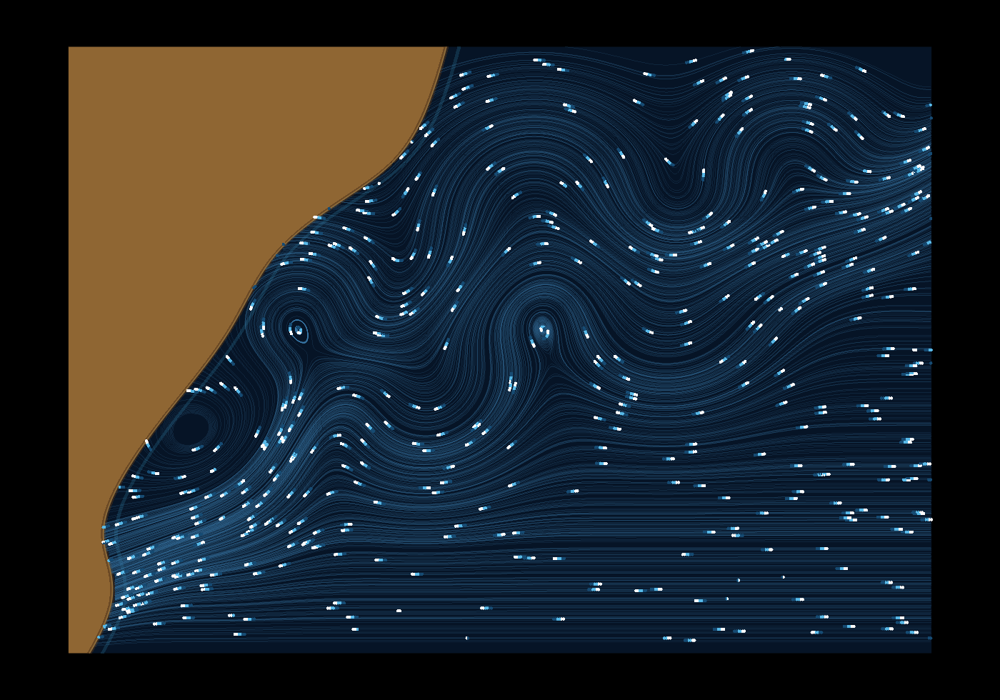

In [5]:
def extract_polylines(polydata, minimum_points=16, maximum_lines=460):
    lines = polydata.lines
    paths = []
    cursor = 0
    while cursor < len(lines):
        count = int(lines[cursor])
        ids = lines[cursor + 1:cursor + 1 + count]
        if count >= minimum_points:
            paths.append(polydata.points[ids])
        cursor += count + 1
    if len(paths) > maximum_lines:
        select = np.linspace(0, len(paths) - 1, maximum_lines, dtype=int)
        paths = [paths[index] for index in select]
    return paths


particle_paths = extract_polylines(dense_currents)
path_lengths = np.array([len(path) for path in particle_paths])
rng = np.random.default_rng(91)
path_offsets = np.array([rng.integers(0, length) for length in path_lengths])
TRAIL_LENGTH = 6


def tracer_cloud(frame):
    positions = []
    brightness = []
    for path, length, offset in zip(particle_paths, path_lengths, path_offsets):
        head = (offset + 3 * frame) % length
        for trail_step in range(TRAIL_LENGTH):
            positions.append(path[(head - 2 * trail_step) % length])
            brightness.append(1.0 - trail_step / TRAIL_LENGTH)
    cloud = pv.PolyData(np.asarray(positions))
    cloud["Glow"] = np.asarray(brightness)
    return cloud


GIF_PATH = Path("perpetual_ocean_currents.gif")
motion_plot = pv.Plotter(off_screen=True, window_size=(1400, 980))
add_map(motion_plot)
motion_plot.add_mesh(
    dense_currents, color="#397aab", opacity=0.17,
    line_width=0.9, lighting=False, render_lines_as_tubes=False,
)
particles = tracer_cloud(0)
particle_actor = motion_plot.add_mesh(
    particles, scalars="Glow",
    cmap=["#164b73", "#58b9e8", "#ffffff"], clim=(0.0, 1.0),
    point_size=4.5, render_points_as_spheres=True,
    lighting=False, show_scalar_bar=False,
)
motion_plot.open_gif(GIF_PATH, fps=18, loop=0)
for frame in range(72):
    particle_actor.mapper.dataset = tracer_cloud(frame)
    particle_actor.mapper.scalar_range = (0.0, 1.0)
    motion_plot.render()
    motion_plot.write_frame()
motion_plot.close()
display(Image(filename=str(GIF_PATH)))

# Streamlines, streamtubes, pathlines, and streaklines

One synthetic, illustrative aircraft-wake model is used throughout. The field combines forward flow, counter-rotating wingtip vortices, and a time-varying gust; it is designed to explain visualization concepts, not aerodynamic performance.

In [1]:
from pathlib import Path

import numpy as np
import pyvista as pv
from matplotlib import colormaps
from matplotlib.colors import LinearSegmentedColormap
from IPython.display import Image, display

pv.set_jupyter_backend("client")
pv.global_theme.background = "black"
pv.global_theme.font.color = "white"
pv.global_theme.font.family = "arial"

X_MIN, X_MAX = -6.5, 12.0
Y_MIN, Y_MAX = -6.0, 6.0
Z_MIN, Z_MAX = -3.8, 3.8
WING_TIPS = 3.8


def wake_velocity(points, time=0.0):
    """Schematic unsteady wake using bounded Lamb-Oseen tip vortices.

    This is a qualitative teaching field, not CFD: it has no aircraft-body
    boundary condition, pressure solution, or turbulence model.
    """
    x, y, z = points.T
    wake_age = np.clip(x + 2.85, 0.0, None)
    downstream = 1.0 / (1.0 + np.exp(-3.0 * (x + 2.85)))
    decay = np.exp(-0.028 * wake_age)

    # Freestream plus a mild wake deficit behind the wing.
    u = 1.22 + 0.035 * np.cos(0.24 * x - 0.42 * time)
    wake_sheet = np.exp(-(z / 0.82) ** 2) * np.exp(-(y / 4.7) ** 6)
    u -= 0.14 * downstream * decay * wake_sheet
    v = np.zeros_like(x)
    w = np.zeros_like(x)

    # Counter-rotating Lamb-Oseen vortices aligned with the downstream axis.
    core_radius = 0.48 + 0.018 * wake_age
    for center_y, spin in [(-WING_TIPS, -1.0), (WING_TIPS, 1.0)]:
        dy = y - center_y
        dz = z
        radius_sq = dy**2 + dz**2
        bounded_core = 1.0 - np.exp(-radius_sq / np.maximum(core_radius**2, 1e-8))
        strength = 0.92 * spin * downstream * decay
        scale = strength * bounded_core / np.maximum(radius_sq, 1e-7)
        v += -scale * dz
        w += scale * dy

    # Downwash between the tip vortices and a weak travelling atmospheric gust.
    w -= 0.12 * downstream * decay * np.exp(-(y / 3.25) ** 4)
    gust = downstream * np.exp(-0.020 * wake_age)
    v += 0.20 * gust * np.sin(0.44 * x - 0.92 * time)
    w += 0.13 * gust * np.cos(0.38 * x - 0.76 * time)

    return np.column_stack((u, v, w))

def advect(points, time, dt):
    """Midpoint integration for moving particles."""
    first = wake_velocity(points, time)
    midpoint = points + 0.5 * dt * first
    return points + dt * wake_velocity(midpoint, time + 0.5 * dt)


# Frozen 3D vector field for streamline-based views.
gx = np.linspace(X_MIN, X_MAX, 80)
gy = np.linspace(Y_MIN, Y_MAX, 48)
gz = np.linspace(Z_MIN, Z_MAX, 36)
GX, GY, GZ = np.meshgrid(gx, gy, gz, indexing="ij")
frozen_grid = pv.StructuredGrid(GX, GY, GZ)
frozen_velocity = wake_velocity(frozen_grid.points, time=0.0)
frozen_grid["Velocity"] = frozen_velocity
frozen_grid["Speed"] = np.linalg.norm(frozen_velocity, axis=1)


# Simple aircraft geometry. The nose points into the oncoming flow (-x).
fuselage = pv.Cylinder(
    center=(-4.15, 0.0, 0.0), direction=(1.0, 0.0, 0.0),
    radius=0.34, height=3.2, resolution=64,
)
nose = pv.Cone(
    center=(-6.05, 0.0, 0.0), direction=(-1.0, 0.0, 0.0),
    height=0.65, radius=0.34, resolution=64,
)
tail_cone = pv.Cone(
    center=(-2.25, 0.0, 0.0), direction=(1.0, 0.0, 0.0),
    height=0.65, radius=0.34, resolution=64,
)


def triangle_mesh(vertices):
    return pv.PolyData(np.asarray(vertices), faces=np.array([3, 0, 1, 2]))


left_wing = triangle_mesh([
    (-4.95, 0.0, 0.02), (-3.18, WING_TIPS, 0.02), (-3.05, 0.0, 0.02)
])
right_wing = triangle_mesh([
    (-4.95, 0.0, 0.02), (-3.18, -WING_TIPS, 0.02), (-3.05, 0.0, 0.02)
])
left_tail = triangle_mesh([
    (-3.10, 0.0, 0.04), (-2.35, 1.55, 0.04), (-2.20, 0.0, 0.04)
])
right_tail = triangle_mesh([
    (-3.10, 0.0, 0.04), (-2.35, -1.55, 0.04), (-2.20, 0.0, 0.04)
])
vertical_tail = triangle_mesh([
    (-3.05, 0.0, 0.12), (-2.30, 0.0, 1.15), (-2.18, 0.0, 0.12)
])
port_light = pv.Sphere(radius=0.12, center=(-3.18, WING_TIPS, 0.05))
starboard_light = pv.Sphere(radius=0.12, center=(-3.18, -WING_TIPS, 0.05))

AIRCRAFT_PARTS = [
    fuselage, nose, tail_cone, left_wing, right_wing,
    left_tail, right_tail, vertical_tail,
]


def add_aircraft(plotter):
    for part in AIRCRAFT_PARTS:
        plotter.add_mesh(
            part, color="#e5edf3", smooth_shading=True,
            ambient=0.36, diffuse=0.72, specular=0.72, specular_power=30,
        )


PERSPECTIVE_CAMERA = [(16.0, -18.0, 10.0), (1.4, 0.0, 0.0), (0.0, 0.0, 1.0)]
TOP_CAMERA = [(2.75, 0.0, 29.0), (2.75, 0.0, 0.0), (0.0, 1.0, 0.0)]


def finish_scene(plotter, top=False):
    plotter.set_background("#02050b")
    plotter.camera_position = TOP_CAMERA if top else PERSPECTIVE_CAMERA
    if top:
        plotter.enable_parallel_projection()
        plotter.camera.parallel_scale = 10.5
    else:
        plotter.camera.zoom(1.08)


def line_mesh(history):
    """Connect each particle through a short stack of time samples."""
    samples = np.stack(history, axis=0)
    steps, particle_count, _ = samples.shape
    points = samples.transpose(1, 0, 2).reshape(-1, 3)
    connectivity = np.column_stack((
        np.full(particle_count, steps),
        np.arange(particle_count * steps).reshape(particle_count, steps),
    )).ravel()
    return pv.PolyData(points, lines=connectivity)


## Streamlines: one frozen timepoint

Every curve is tangent to the velocity field at **t = 0**. Seeds are distributed upstream, across the span, and inside the wake rather than being limited to the wingtips. Color encodes local velocity magnitude using the same scale as every following figure.

The wake is a bounded Lamb–Oseen-style teaching model. It is qualitatively plausible but **not aircraft CFD**.

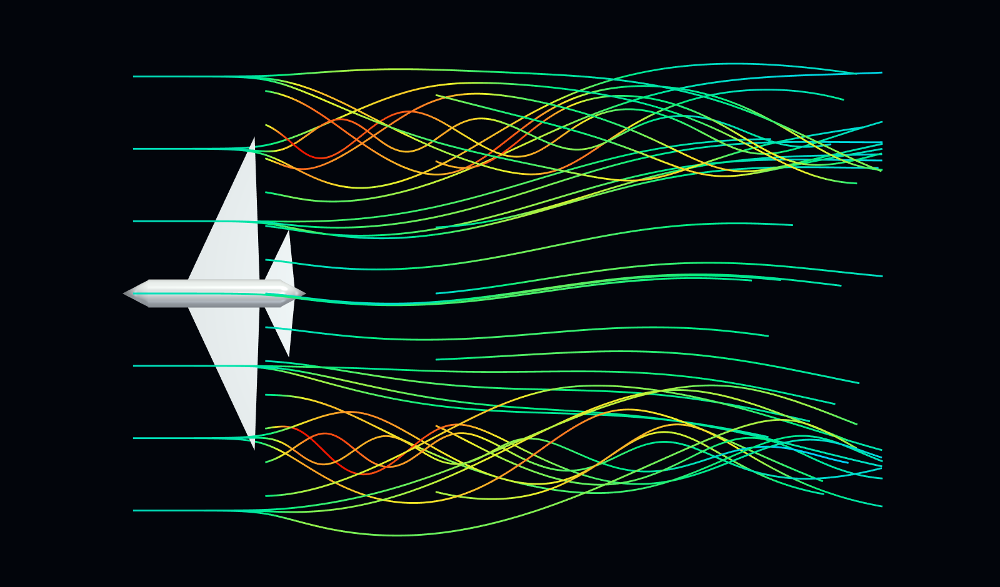

In [2]:
SPEED_LIMITS = (1.05, 1.62)
SPEED_CMAP = LinearSegmentedColormap.from_list(
    "salient_speed",
    ["#0057ff", "#00cfff", "#00ed83", "#eff229", "#ff8124", "#ed1600"],
)

upstream_seeds = np.array([
    (-6.12, y, z)
    for y in np.linspace(-5.25, 5.25, 7)
    for z in (-1.15, 0.15, 1.15)
])
span_seeds = np.array([
    (-2.92, y, 0.42 + 0.12 * np.sin(0.75 * y))
    for y in np.linspace(-4.9, 4.9, 13)
])
wake_seeds = np.array([
    (1.2, y, z)
    for y, z in zip(np.linspace(-4.8, 4.8, 7), np.linspace(-0.9, 0.9, 7))
])
stream_seeds = pv.PolyData(np.vstack((upstream_seeds, span_seeds, wake_seeds)))
streamlines = frozen_grid.streamlines_from_source(
    stream_seeds, vectors="Velocity", integration_direction="forward",
    initial_step_length=0.022, max_step_length=0.065,
    max_steps=7000, max_length=19.0, terminal_speed=1e-4,
    compute_vorticity=False,
)

STREAMLINE_PNG = Path("aircraft_streamlines.png")
stream_plot = pv.Plotter(off_screen=True, window_size=(1600, 940))
add_aircraft(stream_plot)
stream_actor = stream_plot.add_mesh(
    streamlines.tube(radius=0.022, n_sides=10),
    scalars="Speed", cmap=SPEED_CMAP, clim=SPEED_LIMITS,
    lighting=False, show_scalar_bar=False,
)
finish_scene(stream_plot, top=True)
stream_plot.camera.parallel_scale = 7.1
_ = stream_plot.show(screenshot=STREAMLINE_PNG, jupyter_backend="none")
display(Image(filename=str(STREAMLINE_PNG)))

## Streamtubes: selected streamline groups

The thin curves reproduce the same frozen streamline field shown above. Five selected trajectories are promoted into tubes to group neighboring flow. Different reference radii represent differently sized bundles; each tube still expands and contracts according to its local constant-flux relationship. The remaining trajectories stay ungrouped.

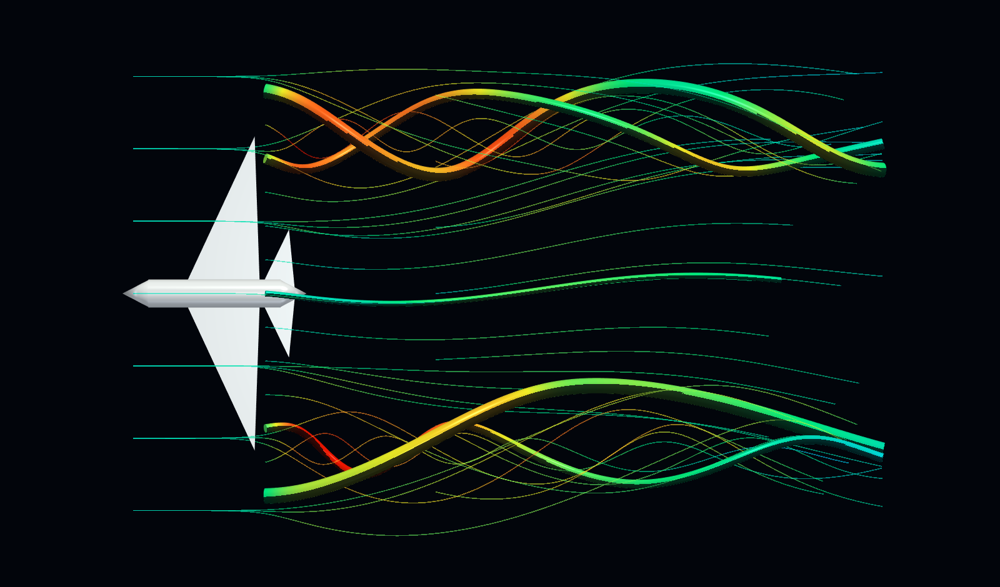

In [3]:
def constant_flux_tube(seed, reference_radius):
    centerline = frozen_grid.streamlines_from_source(
        pv.PolyData(np.asarray(seed)[None, :]), vectors="Velocity",
        integration_direction="forward", initial_step_length=0.016,
        max_step_length=0.050, max_steps=7500, max_length=17.5,
        terminal_speed=1e-4, compute_vorticity=False,
    )
    speed = np.asarray(centerline["Speed"])
    radius = reference_radius * np.sqrt(
        max(float(speed[0]), 1e-6) / np.maximum(speed, 1e-6)
    )
    centerline["Flux radius"] = np.clip(
        radius, 0.48 * reference_radius, 1.55 * reference_radius
    )
    return centerline.tube(
        scalars="Flux radius", absolute=True, n_sides=28, capping=True
    )


# These are exact seeds from the span-seed family in the streamline figure.
selected_indices = [0, 2, 6, 10, 12]
reference_radii = [0.19, 0.105, 0.070, 0.125, 0.175]
selected_seeds = [span_seeds[index] for index in selected_indices]
streamtubes = [
    constant_flux_tube(seed, radius)
    for seed, radius in zip(selected_seeds, reference_radii)
]

TUBE_PNG = Path("aircraft_streamtubes.png")
tube_plot = pv.Plotter(off_screen=True, window_size=(1600, 940))
add_aircraft(tube_plot)

# Preserve the field context: most trajectories remain thin and ungrouped.
tube_plot.add_mesh(
    streamlines.tube(radius=0.013, n_sides=8),
    scalars="Speed", cmap=SPEED_CMAP, clim=SPEED_LIMITS,
    opacity=0.34, lighting=False, show_scalar_bar=False,
)
for tube in streamtubes:
    tube_plot.add_mesh(
        tube, color="#01040a", opacity=0.78, smooth_shading=True,
    )
    tube_plot.add_mesh(
        tube, scalars="Speed", cmap=SPEED_CMAP, clim=SPEED_LIMITS,
        smooth_shading=True, ambient=0.38, diffuse=0.68,
        specular=0.52, specular_power=30, show_scalar_bar=False,
    )

finish_scene(tube_plot, top=True)
tube_plot.camera.parallel_scale = 7.1
_ = tube_plot.show(screenshot=TUBE_PNG, jupyter_backend="none")
display(Image(filename=str(TUBE_PNG)))

## Pathlines during a gentle turn

Particles are released together at **t = 0** and followed until **t = 11.2** while the aircraft begins a gentle turn. A faint aircraft shows the initial heading; the solid, slightly yawed aircraft and curved arrow indicate the later heading. The trajectories bend as the time-dependent lateral component develops. This remains an illustrative maneuver, not a coupled moving-aircraft CFD solution.

For visual contrast, this figure maps its visible 3rd–97th speed percentiles across the full shared `turbo` palette; colors are locally normalized rather than directly comparable between figures.

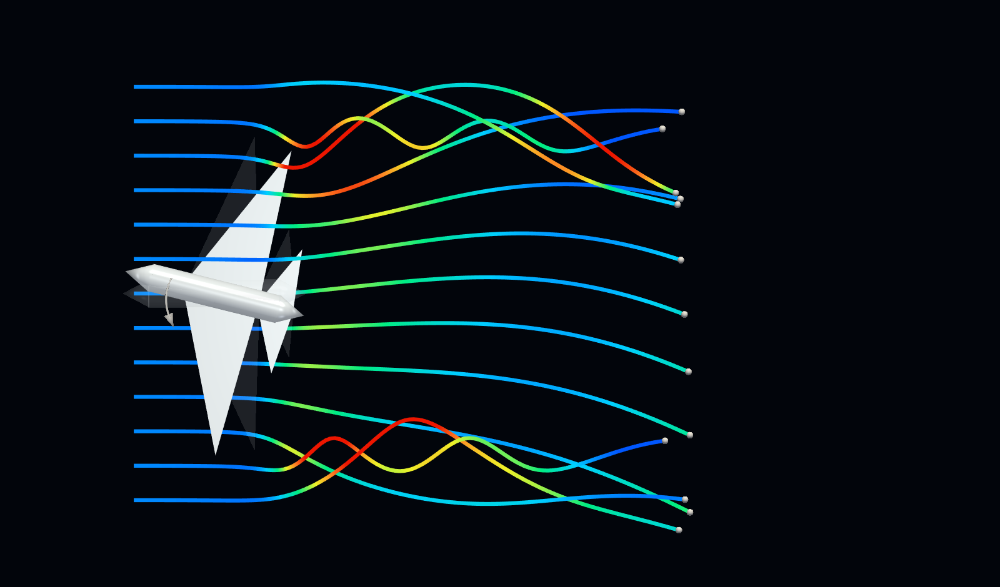

In [4]:
TURN_DURATION = 11.2
FINAL_YAW_DEGREES = -14.0


def turning_velocity(points, time):
    velocity = wake_velocity(points, time)
    turn_fraction = np.clip(time / TURN_DURATION, 0.0, 1.0)
    # Smoothly developing lateral component: a schematic turning wake.
    velocity[:, 1] -= 0.31 * (turn_fraction**1.65)
    return velocity


def advect_turning(points, time, dt):
    first = turning_velocity(points, time)
    midpoint = points + 0.5 * dt * first
    return points + dt * turning_velocity(midpoint, time + 0.5 * dt)


path_y = np.linspace(-5.0, 5.0, 13)
path_z = 1.00 * np.sin(np.linspace(-1.1 * np.pi, 1.1 * np.pi, path_y.size))
path_start = np.column_stack((np.full(path_y.size, -6.10), path_y, path_z))
path_positions = path_start.copy()
path_history = [path_positions.copy()]
path_times = [0.0]

DT = 0.10
for frame in range(112):
    path_positions = advect_turning(path_positions, frame * DT, DT)
    path_history.append(path_positions.copy())
    path_times.append((frame + 1) * DT)


def colored_particle_path(index):
    points = np.stack(path_history, axis=0)[:, index, :]
    curve = pv.PolyData(points)
    curve.lines = np.concatenate(([points.shape[0]], np.arange(points.shape[0])))
    velocities = np.vstack([
        turning_velocity(point[None, :], time)[0]
        for point, time in zip(points, path_times)
    ])
    curve["Speed"] = np.linalg.norm(velocities, axis=1)
    return curve


def add_aircraft_pose(plotter, yaw_degrees, opacity=1.0):
    for part in AIRCRAFT_PARTS:
        posed = part.copy().rotate_z(
            yaw_degrees, point=(-4.15, 0.0, 0.0), inplace=False
        )
        plotter.add_mesh(
            posed, color="#e5edf3", opacity=opacity, smooth_shading=True,
            ambient=0.36, diffuse=0.72, specular=0.72, specular_power=30,
        )


PATHLINE_PNG = Path("aircraft_pathlines.png")
path_plot = pv.Plotter(off_screen=True, window_size=(1600, 940))

# Initial heading as a quiet ghost; final heading as the primary aircraft.
add_aircraft_pose(path_plot, 0.0, opacity=0.12)
add_aircraft_pose(path_plot, FINAL_YAW_DEGREES, opacity=1.0)

path_curves = [
    colored_particle_path(index) for index in range(path_start.shape[0])
]
path_speed_values = np.concatenate([
    np.asarray(curve["Speed"]) for curve in path_curves
])
PATH_SPEED_LIMITS = tuple(np.quantile(path_speed_values, (0.03, 0.97)))

for curve in path_curves:
    path_plot.add_mesh(
        curve.tube(radius=0.048, n_sides=12), scalars="Speed",
        cmap=SPEED_CMAP, clim=PATH_SPEED_LIMITS, lighting=False,
        show_scalar_bar=False,
    )
path_plot.add_mesh(
    pv.PolyData(path_positions), color="#ffffff", point_size=11,
    render_points_as_spheres=True, emissive=True,
)

# A compact curved arrow communicates the maneuver without a text label.
turn_center = np.array([-4.2, -0.15, 0.32])
turn_angles = np.deg2rad(np.linspace(152.0, 202.0, 42))
turn_points = np.column_stack((
    turn_center[0] + 1.12 * np.cos(turn_angles),
    turn_center[1] + 1.12 * np.sin(turn_angles),
    np.full(turn_angles.size, turn_center[2]),
))
turn_arc = pv.Spline(turn_points, 100).tube(radius=0.027, n_sides=10)
path_plot.add_mesh(turn_arc, color="#ffffff", opacity=0.78, smooth_shading=True)
tangent = turn_points[-1] - turn_points[-2]
tangent /= np.linalg.norm(tangent)
arrow_head = pv.Cone(
    center=turn_points[-1] + 0.10 * tangent,
    direction=tangent, height=0.34, radius=0.12, resolution=32,
)
path_plot.add_mesh(arrow_head, color="#ffffff", opacity=0.86, smooth_shading=True)

finish_scene(path_plot, top=True)
path_plot.camera.parallel_scale = 7.1
_ = path_plot.show(screenshot=PATHLINE_PNG, jupyter_backend="none")
display(Image(filename=str(PATHLINE_PNG)))

## Streaklines: dense dye injected ahead of the aircraft

A fixed injector wire now spans the flow immediately ahead of the nose, so the dye begins at the front of the scene. Source samples are deliberately denser near the regions promoted into larger streamtube bundles, while sparse regions remain translucent. Concentration controls opacity and local velocity magnitude controls hue.

The visible dye volume likewise uses robust local speed normalization so its hue range remains vivid despite alpha compositing.

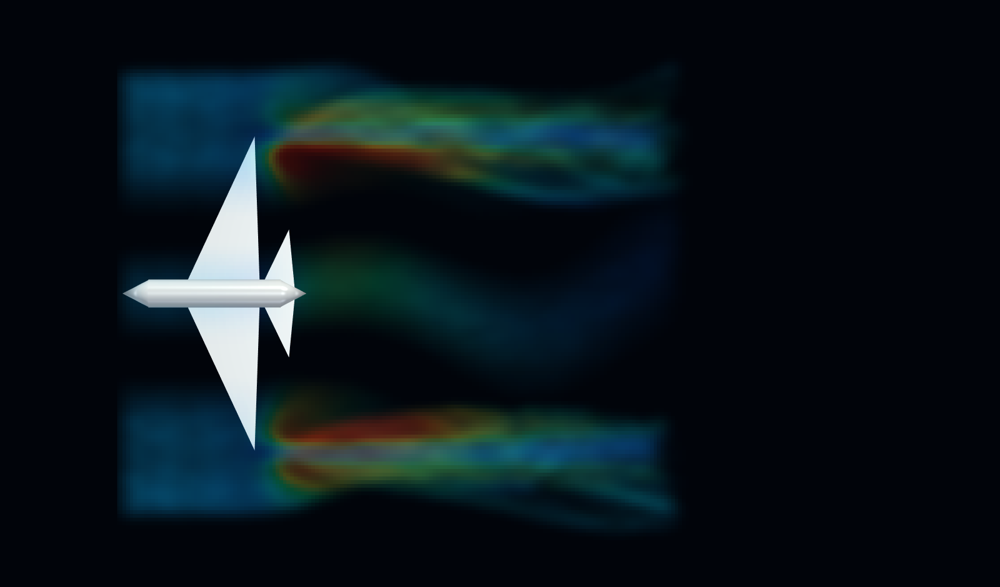

In [5]:
rng = np.random.default_rng(12)

# A continuous injector with smoothly varying strength around selected bundles.
bundle_centers = np.asarray([span_seeds[index, 1] for index in selected_indices])
source_y = np.linspace(-5.25, 5.25, 57)
source_strength = np.zeros(source_y.shape)
for center, radius in zip(bundle_centers, reference_radii):
    width = 0.44 + 1.2 * radius
    amplitude = 0.45 + 0.55 * radius / max(reference_radii)
    source_strength += amplitude * np.exp(
        -0.5 * ((source_y - center) / width) ** 2
    )
source_strength /= source_strength.max()
source_strength[source_strength < 0.085] = 0.0
source_x = np.full_like(source_y, -6.28)
source_z = 0.05 + 0.12 * np.sin(0.72 * source_y)
injector_sources = np.column_stack((source_x, source_y, source_z))

particles = np.empty((0, 3), dtype=float)
particle_age = np.empty(0, dtype=float)
particle_strength = np.empty(0, dtype=float)
DYE_DT = 0.075
DYE_STEPS = 150
for step in range(DYE_STEPS):
    current_time = step * DYE_DT
    if particles.size:
        particles = advect(particles, current_time, DYE_DT)
        particle_age += DYE_DT
    jitter = rng.normal(size=(injector_sources.shape[0], 3, 3))
    jitter[..., 0] *= 0.018
    jitter[..., 1] *= 0.038
    jitter[..., 2] *= 0.050
    injected = (injector_sources[:, None, :] + jitter).reshape(-1, 3)
    particles = np.vstack((particles, injected))
    particle_age = np.concatenate((particle_age, np.zeros(injected.shape[0])))
    particle_strength = np.concatenate((
        particle_strength, np.repeat(source_strength, 3)
    ))

bounds = [(-6.5, 12.1), (-6.2, 6.2), (-3.6, 3.6)]
inside = (
    (particles[:, 0] >= bounds[0][0]) & (particles[:, 0] <= bounds[0][1])
    & (particles[:, 1] >= bounds[1][0]) & (particles[:, 1] <= bounds[1][1])
    & (particles[:, 2] >= bounds[2][0]) & (particles[:, 2] <= bounds[2][1])
)
particles = particles[inside]
particle_age = particle_age[inside]
particle_strength = particle_strength[inside]
weights = particle_strength * np.exp(-0.020 * particle_age)

shape = (216, 136, 92)
edges = [np.linspace(lo, hi, count + 1) for (lo, hi), count in zip(bounds, shape)]
density, _ = np.histogramdd(particles, bins=edges, weights=weights)


def gaussian_diffuse_fft(values, sigma_voxels=(2.4, 1.70, 1.9)):
    pad = tuple((int(4 * sigma) + 1,) * 2 for sigma in sigma_voxels)
    padded = np.pad(values, pad, mode="constant")
    frequencies = [np.fft.fftfreq(n) for n in padded.shape]
    fx, fy, fz = np.meshgrid(*frequencies, indexing="ij")
    sx, sy, sz = sigma_voxels
    kernel = np.exp(-2.0 * np.pi**2 * (
        sx**2 * fx**2 + sy**2 * fy**2 + sz**2 * fz**2
    ))
    blurred = np.fft.ifftn(np.fft.fftn(padded) * kernel).real
    slices = tuple(slice(before, -after) for before, after in pad)
    return blurred[slices]


density = gaussian_diffuse_fft(density)
density /= max(float(density.max()), 1e-12)
density = np.clip(density, 0.0, 1.0) ** 0.62
spacing = tuple((hi - lo) / count for (lo, hi), count in zip(bounds, shape))
dye_grid = pv.ImageData(
    dimensions=np.asarray(shape) + 1,
    spacing=spacing,
    origin=tuple(lo for lo, _ in bounds),
)
dye_grid.cell_data["Dye concentration"] = density.ravel(order="F")
dye_grid = dye_grid.cell_data_to_point_data()

observation_time = DYE_STEPS * DYE_DT
grid_speed = np.empty(dye_grid.n_points)
chunk_size = 200_000
for start in range(0, dye_grid.n_points, chunk_size):
    stop = min(start + chunk_size, dye_grid.n_points)
    velocity = wake_velocity(dye_grid.points[start:stop], observation_time)
    grid_speed[start:stop] = np.linalg.norm(velocity, axis=1)

point_density = np.asarray(dye_grid["Dye concentration"])
visible_speed = grid_speed[point_density > 0.055]
DYE_SPEED_LIMITS = tuple(np.quantile(visible_speed, (0.03, 0.97)))
speed_normalized = np.clip(
    (grid_speed - DYE_SPEED_LIMITS[0])
    / (DYE_SPEED_LIMITS[1] - DYE_SPEED_LIMITS[0]),
    0.0, 1.0,
)
rgba_float = np.asarray(SPEED_CMAP(speed_normalized) * 255)
rgba_float[:, :3] = np.clip(10.0 + 1.08 * rgba_float[:, :3], 0, 255)
rgba = rgba_float.astype(np.uint8)
alpha = np.zeros_like(point_density)
visible = point_density > 0.035
alpha[visible] = 225.0 * (
    (point_density[visible] - 0.035) / 0.965
) ** 1.35
rgba[:, 3] = np.clip(alpha, 0, 235).astype(np.uint8)
dye_grid.point_data["Velocity magnitude_rgba"] = rgba

DYE_PNG = Path("aircraft_streakline_dye.png")
dye_plot = pv.Plotter(off_screen=True, window_size=(1600, 940))
dye_plot.add_volume(
    dye_grid, scalars="Velocity magnitude_rgba", opacity="linear",
    blending="composite", mapper="smart", shade=False,
    opacity_unit_distance=0.12, show_scalar_bar=False,
)
add_aircraft(dye_plot)

dye_plot.set_background("#01040a")
dye_plot.camera_position = TOP_CAMERA
dye_plot.enable_parallel_projection()
dye_plot.camera.parallel_scale = 7.1
_ = dye_plot.show(screenshot=DYE_PNG, jupyter_backend="none")
display(Image(filename=str(DYE_PNG)))

## Streaklines: coloured dye injection (top-down portrait)

Seven dye tubes are injected upstream at different spanwise positions — each colour marks a distinct region of the flow. Near the injector the streams are thin and crisp; downstream they diffuse into organic cloudy wakes driven by the wingtip vortices. Spreading is accumulated via a step-weighted particle-density map so the thin→cloud transition is continuous rather than abrupt.

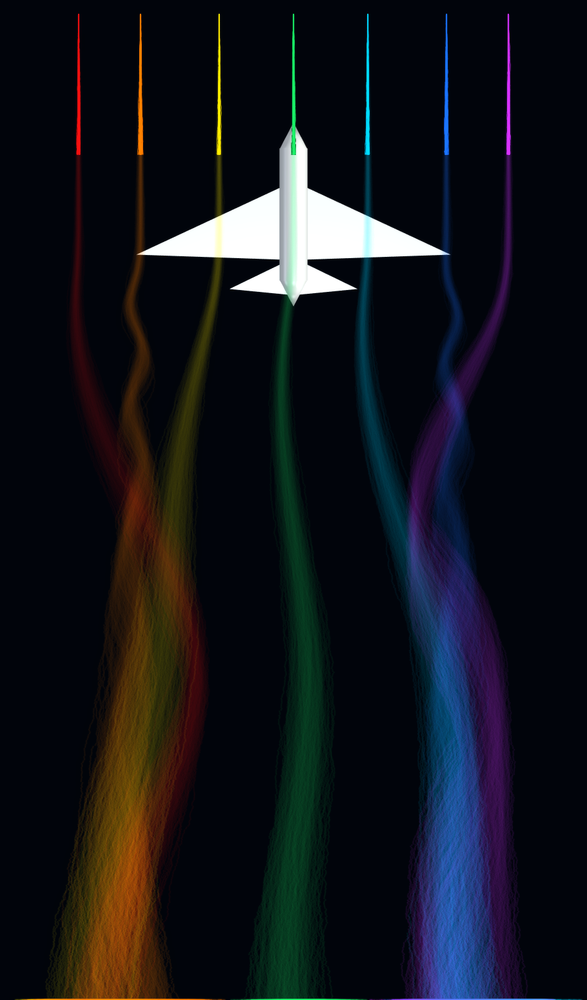

In [6]:
from PIL import Image as PILImage
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
import matplotlib.collections as mc

DYE_TUBES = [
    (-5.2, "#e81010"), (-3.7, "#ff7a00"), (-1.8, "#f5e200"),
    ( 0.0, "#18e060"), ( 1.8, "#00d0ff"), ( 3.7, "#1a6eff"),
    ( 5.2, "#cc30ff"),
]

# ── parameters ────────────────────────────────────────────────────────────────
_N_SUB     = 400
_BR_BASE   = 0.0014   # Brownian noise at injection (near-zero)
_BR_GROW   = 15       # grows 15× downstream → cloudy wake
_DYE_DT    = 0.028
_MAX_STEPS = 1000
_INJ_X     = -9.0
_SEED_SPR  = 0.003
_W_MIN     = 0.06     # early steps get this weight (0=invisible)
_W_POW     = 2.2      # quadratic-ish ramp to full weight at end
_CL_SIGMA  = 1.8      # density anti-alias (NOT diffusion blur)
_CL_GAMMA  = 0.40     # tone-map gamma — preserves faint wisps
_CL_BOOST  = 8.5      # opacity multiplier
_N_THIN    = 25       # threads drawn as crisp injection threads
_THIN_STEPS = 100
_W, _H     = 1600, 940
_DPI       = 200
_SC        = 3        # supersampling factor for density grid
_WS, _HS   = _W*_SC, _H*_SC
_XV0, _XV1 = -9.34, 14.84
_YV0, _YV1 = -7.10,  7.10

def _hex_rgb(h):
    h = h.lstrip("#")
    return tuple(int(h[i:i+2], 16)/255 for i in (0, 2, 4))

def _w2px(x, y):
    return (x-_XV0)/(_XV1-_XV0)*_WS, (1.-(y-_YV0)/(_YV1-_YV0))*_HS

_sw = np.array([_W_MIN + (1-_W_MIN)*(s/_MAX_STEPS)**_W_POW
                for s in range(_MAX_STEPS+1)], dtype=np.float32)
_rng = np.random.default_rng(31)

# ── simulate + accumulate density ─────────────────────────────────────────────
_cloud_rgb   = np.zeros((_H, _W, 3), dtype=np.float32)
_cloud_alpha = np.zeros((_H, _W),    dtype=np.float32)
_thin_data   = {}

for _ti, (_y0, _hcol) in enumerate(DYE_TUBES):
    _col   = np.array(_hex_rgb(_hcol), dtype=np.float32)
    _sy    = _y0 + _rng.uniform(-_SEED_SPR, _SEED_SPR, _N_SUB)
    _sz    =       _rng.uniform(-_SEED_SPR*.5, _SEED_SPR*.5, _N_SUB)
    _P     = np.column_stack((np.full(_N_SUB, _INJ_X), _sy, _sz))
    _thin  = [_P[:_N_THIN, :2].copy()]
    _dens  = np.zeros((_HS, _WS), dtype=np.float32)

    for _s in range(_MAX_STEPS):
        _P    += _DYE_DT * wake_velocity(_P, 0.0)
        _sig   = _BR_BASE * (1. + _BR_GROW * _s / _MAX_STEPS)
        _n     = _rng.normal(0, _sig, _P.shape)
        _n[:, 0] *= 0.10
        _P    += _n
        _cx, _ry = _w2px(_P[:,0], _P[:,1])
        _ci = np.clip(_cx.astype(int), 0, _WS-1)
        _ri = np.clip(_ry.astype(int), 0, _HS-1)
        np.add.at(_dens, (_ri, _ci), float(_sw[_s+1]))
        if _s < _THIN_STEPS:
            _thin.append(_P[:_N_THIN, :2].copy())

    _thin_data[_ti] = _thin
    _dens = gaussian_filter(_dens, sigma=_CL_SIGMA)
    _dm   = _dens.max()
    if _dm <= 0:
        continue
    _dens /= _dm
    _dens  = _dens ** _CL_GAMMA
    _di    = PILImage.fromarray((np.clip(_dens,0,1)*255).astype(np.uint8), mode="L")
    _ds    = np.array(_di.resize((_W,_H), PILImage.LANCZOS)).astype(np.float32)/255.
    _cloud_rgb   += _ds[:,:,None] * _col[None,None,:]
    _cloud_alpha += _ds

_dye_color   = np.clip(_cloud_rgb / np.maximum(_cloud_alpha[:,:,None], 1e-7), 0, 1)
_dye_opacity = np.clip(_cloud_alpha / _cloud_alpha.max() * _CL_BOOST, 0, 1)

# ── aircraft background ───────────────────────────────────────────────────────
_bg_png  = Path("_dye_bg.png")
_bg_plot = pv.Plotter(off_screen=True, window_size=(_W, _H))
_bg_plot.set_background("#01040a")
add_aircraft(_bg_plot)
_bg_plot.camera_position = TOP_CAMERA
_bg_plot.enable_parallel_projection()
_bg_plot.camera.parallel_scale = 7.1
_bg_plot.show(screenshot=str(_bg_png), jupyter_backend="none")
_plane_arr = np.array(PILImage.open(_bg_png).convert("RGB")).astype(np.float32)/255.
_bg_png.unlink()

# ── thin injection-thread overlay ─────────────────────────────────────────────
_fig, _ax = plt.subplots(figsize=(_W/_DPI, _H/_DPI), dpi=_DPI)
_fig.patch.set_facecolor("black"); _ax.set_facecolor("black")
_ax.set_xlim(_XV0, _XV1); _ax.set_ylim(_YV0, _YV1)
_ax.set_aspect("equal"); _ax.axis("off")
_fig.subplots_adjust(0, 0, 1, 1)
for _ti, (_y0, _hcol) in enumerate(DYE_TUBES):
    _cr = _hex_rgb(_hcol)
    _tr = _thin_data[_ti]
    _sg = []
    for _t in range(_N_THIN):
        for _s in range(len(_tr)-1):
            _sg.append([_tr[_s][_t], _tr[_s+1][_t]])
    if _sg:
        _ax.add_collection(mc.LineCollection(
            _sg, colors=[(*_cr, 0.92)], linewidths=0.30,
            antialiaseds=True, capstyle="round"
        ))
_tp = Path("_dye_thin.png")
plt.savefig(str(_tp), dpi=_DPI, bbox_inches=None, pad_inches=0, facecolor="black")
plt.close(_fig)
_thin_arr = np.array(PILImage.open(_tp).convert("RGB")).astype(np.float32)/255.
_tp.unlink()

# ── composite: dye over aircraft, portrait orientation ────────────────────────
_a3   = _dye_opacity[:,:,None]
_comp = _dye_color * _a3 + _plane_arr * (1. - _a3)
_ta   = np.clip(_thin_arr.max(axis=2, keepdims=True) * 3.5, 0, 1)
_comp = np.clip(_thin_arr * _ta + _comp * (1. - _ta), 0, 1)
_glow = gaussian_filter(_comp, sigma=(2, 2, 0))
_comp = np.clip(_comp + _glow * 0.10, 0, 1)

STREAKLINE_DYE_PNG = Path("aircraft_streaklines_dye_topdown.png")
PILImage.fromarray((_comp*255).astype(np.uint8)).rotate(-90, expand=True).save(str(STREAKLINE_DYE_PNG))
display(Image(filename=str(STREAKLINE_DYE_PNG)))

# Kármán Vortex Street: Line Integral Convolution

When flow passes a bluff body like a cylinder, it separates and rolls up into alternating vortices that shed periodically downstream — the **Kármán vortex street**. The phenomenon is responsible for the oscillating forces that caused the Tacoma Narrows Bridge to collapse and makes overhead wires sing in the wind.

**Line Integral Convolution (LIC)** reveals the direction structure of a vector field without showing individual arrows. White noise is smeared along streamlines: pixels aligned with the flow end up correlated (bright streaks), while pixels across the flow remain uncorrelated. The result is a texture that makes every local flow direction immediately legible.

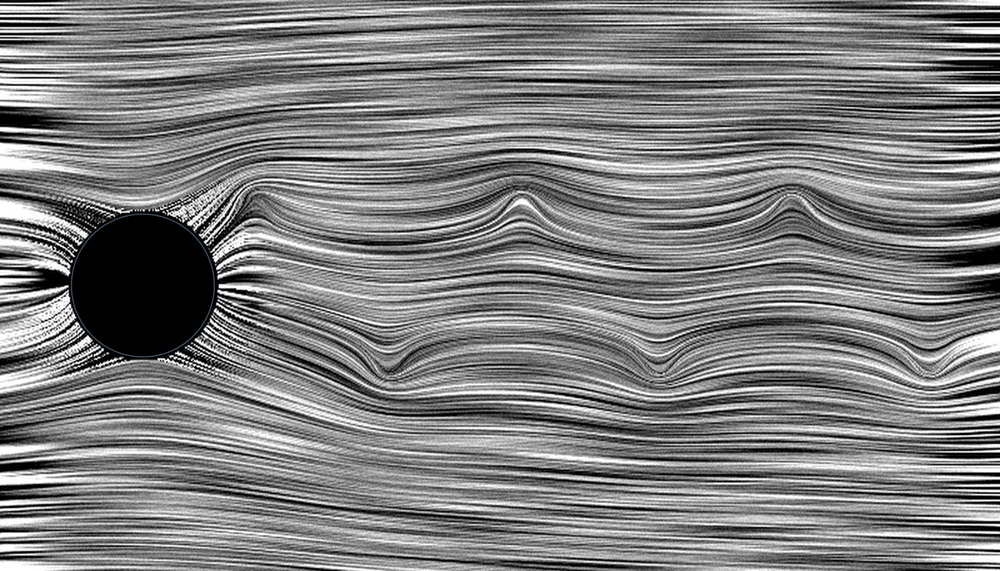

In [1]:
from pathlib import Path

import numpy as np
import pyvista as pv
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap
from PIL import Image as PILImage
from IPython.display import Image, display

pv.set_jupyter_backend("client")
pv.global_theme.background = "#02050b"
pv.global_theme.font.color = "white"
pv.global_theme.font.family = "arial"

SPEED_CMAP = LinearSegmentedColormap.from_list(
    "salient_speed",
    ["#0057ff", "#00cfff", "#00ed83", "#eff229", "#ff8124", "#ed1600"],
)

# ── analytical Kármán velocity field ──────────────────────────────────────────
R = 1.0
U = 1.0
h = 0.9
lam = 3.8
Gamma = 1.8
N_VORTEX = 8
x_start = 1.5

vortex_centers = []
for n in range(N_VORTEX):
    xn = x_start + n * lam
    vortex_centers.append((xn,         +h,  +1.0))
    vortex_centers.append((xn + lam/2, -h, -1.0))


def karman_velocity(x2d, y2d):
    r2 = x2d**2 + y2d**2
    r4 = np.maximum(r2**2, 1e-10)
    outside = r2 > (R * 1.05)**2
    u_pot = U * (1.0 - R**2 * (x2d**2 - y2d**2) / r4)
    v_pot = -U * R**2 * 2.0 * x2d * y2d / r4
    u_pot = np.where(outside, u_pot, 0.0)
    v_pot = np.where(outside, v_pot, 0.0)
    u_vort = np.zeros_like(x2d)
    v_vort = np.zeros_like(y2d)
    for xv, yv, sign in vortex_centers:
        dx, dy = x2d - xv, y2d - yv
        rv2 = np.maximum(dx**2 + dy**2, 0.3**2)
        circ = sign * Gamma / (2.0 * np.pi)
        u_vort += -circ * dy / rv2
        v_vort +=  circ * dx / rv2
    u = np.where(outside, u_pot + u_vort, 0.0)
    v = np.where(outside, v_pot + v_vort, 0.0)
    return u, v


# ── 2D grid ───────────────────────────────────────────────────────────────────
x_min, x_max = -2.0, 12.0
y_min, y_max = -4.0,  4.0
NX, NY = 800, 400

xs = np.linspace(x_min, x_max, NX)
ys = np.linspace(y_min, y_max, NY)
X2, Y2 = np.meshgrid(xs, ys)
u_field, v_field = karman_velocity(X2, Y2)
speed_field = np.sqrt(u_field**2 + v_field**2)
cyl_mask = (X2**2 + Y2**2) < (R * 1.05)**2


# ── high-quality LIC with bilinear interpolation ──────────────────────────────
def lic_2d(u_f, v_f, steps=80, seed=42):
    ny, nx = u_f.shape
    rng = np.random.default_rng(seed)
    noise = rng.uniform(0, 1, (ny, nx)).astype(np.float32)
    dx_world = (x_max - x_min) / nx
    dy_world = (y_max - y_min) / ny
    up = (u_f / dx_world).astype(np.float32)
    vp = (v_f / dy_world).astype(np.float32)
    spd = np.sqrt(up**2 + vp**2) + 1e-10
    un, vn = up / spd, vp / spd

    def bilerp(px, py):
        x0 = np.clip(px.astype(np.int32), 0, nx - 2)
        y0 = np.clip(py.astype(np.int32), 0, ny - 2)
        fx = np.clip(px - x0, 0, 1)
        fy = np.clip(py - y0, 0, 1)
        return (noise[y0,   x0] * (1 - fx) * (1 - fy) +
                noise[y0,   x0 + 1] * fx * (1 - fy) +
                noise[y0 + 1, x0] * (1 - fx) * fy +
                noise[y0 + 1, x0 + 1] * fx * fy)

    result = np.zeros((ny, nx), dtype=np.float32)
    weight = np.zeros((ny, nx), dtype=np.float32)
    for direction in [1, -1]:
        px = np.tile(np.arange(nx, dtype=np.float32), (ny, 1))
        py = np.tile(np.arange(ny, dtype=np.float32), (nx, 1)).T
        for s in range(steps):
            ix = np.clip(px.astype(np.int32), 0, nx - 1)
            iy = np.clip(py.astype(np.int32), 0, ny - 1)
            w = 1.0 - s / steps
            result += w * bilerp(px, py)
            weight += w
            px = np.clip(px + direction * un[iy, ix], 0, nx - 1)
            py = np.clip(py - direction * vn[iy, ix], 0, ny - 1)
    lic = result / np.maximum(weight, 1e-10)
    lo, hi = np.percentile(lic, 5), np.percentile(lic, 95)
    return np.clip((lic - lo) / (hi - lo + 1e-10), 0, 1)


lic = lic_2d(u_field, v_field)
lic_show = lic.copy()
lic_show[cyl_mask] = 0.0  # solid black cylinder

fig, ax = plt.subplots(figsize=(14, 7), dpi=200)
fig.patch.set_facecolor("#02050b")
ax.set_facecolor("#02050b")
ax.imshow(lic_show, cmap="gray", origin="lower",
          extent=[x_min, x_max, y_min, y_max],
          vmin=0.0, vmax=1.0, interpolation="lanczos")
cyl_patch = mpatches.Circle((0, 0), R, linewidth=1.0, edgecolor="#445566",
                              facecolor="#000000", zorder=5)
ax.add_patch(cyl_patch)
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.axis("off")
fig.tight_layout(pad=0)
GREY_LIC_PNG = Path("karman_lic_greyscale.png")
fig.savefig(str(GREY_LIC_PNG), dpi=200, bbox_inches="tight",
            pad_inches=0, facecolor="#02050b")
plt.close(fig)
display(Image(filename=str(GREY_LIC_PNG)))


## LIC coloured by velocity magnitude

The same LIC texture now modulates a hue derived from local flow speed: slow recirculation zones deep in the vortex cores appear blue, while the accelerated flow on the flanks of the cylinder and between the vortices runs through cyan and yellow toward red. The LIC brightness encodes direction; hue encodes speed.

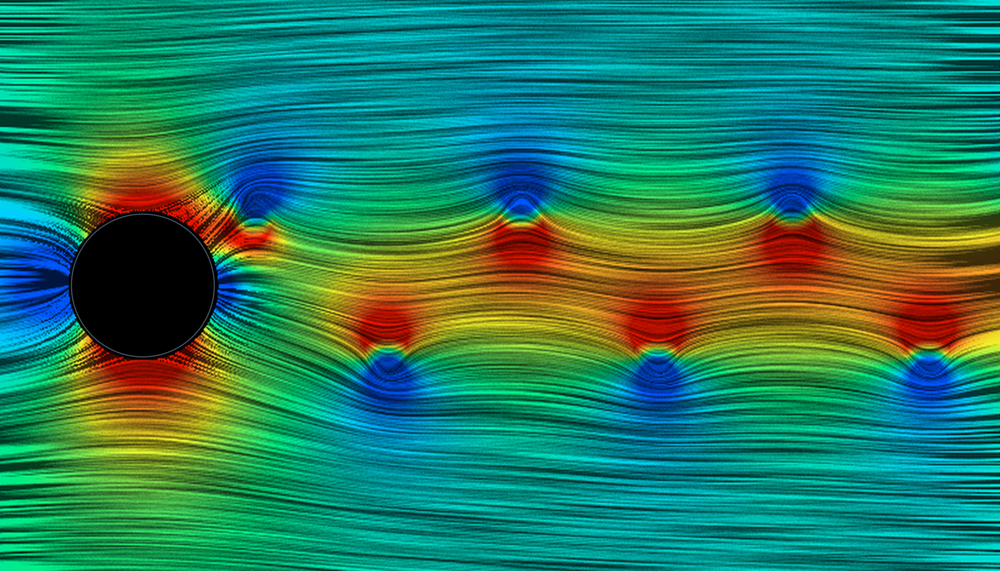

In [2]:
outside_mask = ~cyl_mask
spd_vals = speed_field[outside_mask]
spd_lo, spd_hi = np.percentile(spd_vals, 2), np.percentile(spd_vals, 98)
spd_norm = np.clip((speed_field - spd_lo) / (spd_hi - spd_lo), 0, 1)

cmap_rgb = SPEED_CMAP(spd_norm)[..., :3].astype(np.float32)
colored = cmap_rgb * (0.25 + 0.75 * lic[:, :, None])
colored[cyl_mask] = 0.0
colored = np.clip(colored, 0, 1)

fig, ax = plt.subplots(figsize=(14, 7), dpi=200)
fig.patch.set_facecolor("#02050b")
ax.set_facecolor("#02050b")
ax.imshow(colored, origin="lower",
          extent=[x_min, x_max, y_min, y_max], interpolation="lanczos")
cyl_patch2 = mpatches.Circle((0, 0), R, linewidth=1.0, edgecolor="#445566",
                               facecolor="#000000", zorder=5)
ax.add_patch(cyl_patch2)
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.axis("off")
fig.tight_layout(pad=0)
COLORED_LIC_PNG = Path("karman_lic_colored.png")
fig.savefig(str(COLORED_LIC_PNG), dpi=200, bbox_inches="tight",
            pad_inches=0, facecolor="#02050b")
plt.close(fig)
display(Image(filename=str(COLORED_LIC_PNG)))


## 3D cracked-open volume: shell with surface LIC

A 3D bounding box is cracked open — the top and front faces are removed so the interior is visible. Two cut surfaces (the floor, z = 0, and the back wall, y = 0) are textured with LIC of the potential flow past a sphere. A helix shell sits inside the domain; its surface carries its own surface LIC whose streamlines spiral along the arm of the shell. Speed drives the colour scale on the floor and wall; coil position (innermost = blue → outermost = red) drives the shell colour.

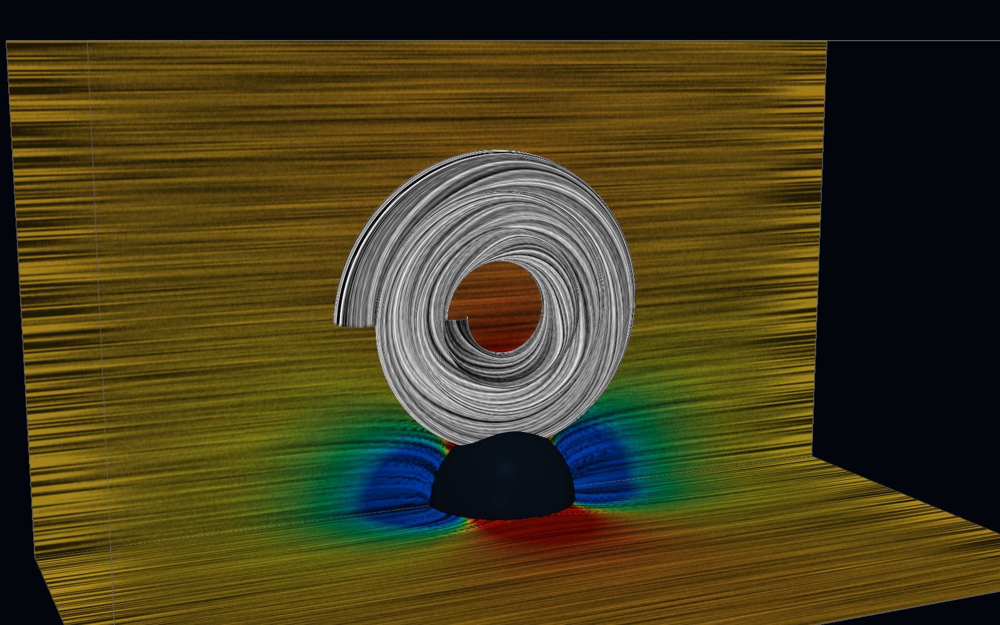

In [3]:
# ── Domain / sphere flow ──────────────────────────────────────────────────
U_3d = 1.0;  R_3d = 1.0
x3_min, x3_max = -5.0, 6.0
y3_min, y3_max =  0.0, 5.5
z3_min, z3_max =  0.0, 6.0


def sphere3d_flow(Xs, Ys, Zs):
    r2 = Xs**2 + Ys**2 + Zs**2
    r  = np.maximum(np.sqrt(r2), 1e-9)
    k  = R_3d**3 / (2.0 * r**3)
    vx = U_3d * (1.0 + k - 3.0*k*Xs**2/r**2)
    vy = -3.0 * U_3d * k * Xs * Ys / r**2
    vz = -3.0 * U_3d * k * Xs * Zs / r**2
    mask = r2 < R_3d**2
    vx[mask] = vy[mask] = vz[mask] = 0.0
    return vx, vy, vz, mask


# ── Flat spiral shell (face-on to back wall y=0) ──────────────────────────
# Coil arm traces a logarithmic spiral in the xz-plane.
# Tube cross-section is perpendicular to the spiral tangent, depth into y>0.
x0_sh = 0.0;  z0_sh = 2.5           # spiral centre on back wall
R0_sh = 2.0;  k_sh = 0.052          # k_sh ≈ -ln(1 - 2*r_tb/R0)/(2π) → touching coils
r_tb  = 0.28                         # tube radius
u_sh_min, u_sh_max = 0.0, 3.0 * 2 * np.pi   # 3 full turns
NUS, NVS = 480, 240


def sh_pos(u, v):
    rh = R0_sh * np.exp(-k_sh * u)
    cx = x0_sh + rh * np.cos(u)
    cz = z0_sh + rh * np.sin(u)
    k1 = np.sqrt(1.0 + k_sh**2)
    # Frenet normal in xz (points toward curvature centre = inward spiral)
    nx = (k_sh * np.sin(u) - np.cos(u)) / k1
    nz = (-k_sh * np.cos(u) - np.sin(u)) / k1
    x = cx + r_tb * np.cos(v) * nx
    y =      r_tb * np.sin(v)         # depth into y>0 (front half visible)
    z = cz + r_tb * np.cos(v) * nz
    return x, y, z


# ── Flat LIC helper ───────────────────────────────────────────────────────
def lic_flat(u2d, v2d, nu, nv, steps=80, seed=7):
    spd = np.sqrt(u2d**2 + v2d**2) + 1e-10
    un  = (u2d / spd).astype(np.float32)
    vn  = (v2d / spd).astype(np.float32)
    noise  = np.random.default_rng(seed).uniform(0, 1, (nv, nu)).astype(np.float32)
    result = noise.copy(); weight = np.ones_like(noise)
    for d in [1, -1]:
        px = np.tile(np.arange(nu, dtype=np.float32), (nv, 1))
        py = np.tile(np.arange(nv, dtype=np.float32), (nu, 1)).T
        for s in range(steps):
            x0 = np.clip(px.astype(np.int32), 0, nu-2)
            y0 = np.clip(py.astype(np.int32), 0, nv-2)
            fx = np.clip(px-x0, 0., 1.); fy = np.clip(py-y0, 0., 1.)
            val = (noise[y0,x0]*(1-fx)*(1-fy) + noise[y0,x0+1]*fx*(1-fy) +
                   noise[y0+1,x0]*(1-fx)*fy   + noise[y0+1,x0+1]*fx*fy)
            w = 1.0 - s/steps; result += w*val; weight += w
            ix = np.clip(px.astype(np.int32), 0, nu-1)
            iy = np.clip(py.astype(np.int32), 0, nv-1)
            px = np.clip(px + d*un[iy,ix], 0, nu-1)
            py = np.clip(py - d*vn[iy,ix], 0, nv-1)
    return result / weight


def colorize(lic, speed, mask):
    out = ~mask
    lo, hi = np.percentile(lic[out], 3), np.percentile(lic[out], 97)
    lc = np.clip((lic-lo)/(hi-lo+1e-10), 0, 1); lc[mask] = 0.
    sp = speed.copy(); sp[mask] = 0.
    s_lo, s_hi = np.percentile(sp[out], 2), np.percentile(sp[out], 98)
    spn = np.clip((sp-s_lo)/(s_hi-s_lo+1e-10), 0, 1)
    rgb = np.clip(SPEED_CMAP(spn)[...,:3] * (0.2+0.8*lc[...,None]), 0, 1)
    rgb[mask] = 0.
    return (rgb*255).astype(np.uint8)


def quad_poly(pts, tc, ni, nj):
    stride = nj + 1
    II, JJ = np.meshgrid(np.arange(ni), np.arange(nj), indexing='ij')
    p0=(II*stride+JJ).ravel(); p1=((II+1)*stride+JJ).ravel()
    p2=((II+1)*stride+JJ+1).ravel(); p3=(II*stride+JJ+1).ravel()
    poly = pv.PolyData(pts, np.column_stack([np.full(ni*nj,4),p0,p1,p2,p3]).ravel())
    poly.active_texture_coordinates = tc
    return poly


# ── Floor (z=0) LIC ───────────────────────────────────────────────────────
NX_F, NY_F = 550, 220
Xf, Yf = np.meshgrid(np.linspace(x3_min,x3_max,NX_F), np.linspace(y3_min,y3_max,NY_F))
vxf, vyf, _, mf = sphere3d_flow(Xf, Yf, np.zeros_like(Xf))
ppx = NX_F/(x3_max-x3_min)
lic_f = lic_flat(vxf*ppx, vyf*(NY_F/(y3_max-y3_min)), NX_F, NY_F)
lic_tex_floor = pv.numpy_to_texture(np.flipud(colorize(lic_f, np.sqrt(vxf**2+vyf**2), mf)))
lic_tex_floor.InterpolateOn()
Xfp, Yfp = np.meshgrid(np.linspace(x3_min,x3_max,21), np.linspace(y3_min,y3_max,11), indexing='ij')
tc_f = np.column_stack([((Xfp-x3_min)/(x3_max-x3_min)).ravel(), ((Yfp-y3_min)/(y3_max-y3_min)).ravel()])
floor_poly = quad_poly(np.column_stack([Xfp.ravel(),Yfp.ravel(),np.zeros(Xfp.size)]), tc_f, 20, 10)

# ── Back wall (y=0) LIC ───────────────────────────────────────────────────
NX_W, NZ_W = 550, 260
Xw, Zw = np.meshgrid(np.linspace(x3_min,x3_max,NX_W), np.linspace(z3_min,z3_max,NZ_W))
vxw, _, vzw, mw = sphere3d_flow(Xw, np.zeros_like(Xw), Zw)
ppz = NZ_W/(z3_max-z3_min)
lic_w = lic_flat(vxw*ppx, vzw*ppz, NX_W, NZ_W)
lic_tex_wall = pv.numpy_to_texture(np.flipud(colorize(lic_w, np.sqrt(vxw**2+vzw**2), mw)))
lic_tex_wall.InterpolateOn()
Xwp, Zwp = np.meshgrid(np.linspace(x3_min,x3_max,21), np.linspace(z3_min,z3_max,11), indexing='ij')
tc_w = np.column_stack([((Xwp-x3_min)/(x3_max-x3_min)).ravel(), ((Zwp-z3_min)/(z3_max-z3_min)).ravel()])
wall_poly = quad_poly(np.column_stack([Xwp.ravel(),np.zeros(Xwp.size),Zwp.ravel()]), tc_w, 20, 10)

# ── Shell surface LIC ─────────────────────────────────────────────────────
U_lic = np.linspace(u_sh_min, u_sh_max, NUS)
V_lic = np.linspace(0, 2*np.pi, NVS)
Ul, Vl = np.meshgrid(U_lic, V_lic)   # (NVS, NUS)

# Multi-harmonic irregular flow (spirals along arm + wavy tube perturbation)
fpu = (1.0 + 0.30*np.cos(2*Vl) + 0.20*np.sin(3*Ul + 0.7)).astype(np.float32)
fpv = (0.60*np.sin(Vl) + 0.30*np.sin(2*Vl - 0.5) + 0.25*np.cos(3*Ul + 1.5)).astype(np.float32)
spd_sh = np.sqrt(fpu**2 + fpv**2) + 1e-10
fpu /= spd_sh; fpv /= spd_sh

noise_sh = np.random.default_rng(17).uniform(0,1,(NVS,NUS)).astype(np.float32)
res_sh = noise_sh.copy(); wt_sh = np.ones_like(noise_sh)
for d in [1, -1]:
    px = np.tile(np.arange(NUS, dtype=np.float32), (NVS, 1))
    py = np.tile(np.arange(NVS, dtype=np.float32), (NUS, 1)).T
    for s in range(100):
        pxi = np.floor(px).astype(np.int32)
        pyi = np.floor(py).astype(np.int32) % NVS
        x0  = np.clip(pxi, 0, NUS-2); y0 = pyi; y1 = (pyi+1)%NVS
        fx  = px-pxi; fy = py-pyi
        val = (noise_sh[y0,x0]*(1-fx)*(1-fy)+noise_sh[y0,x0+1]*fx*(1-fy)+
               noise_sh[y1,x0]*(1-fx)*fy    +noise_sh[y1,x0+1]*fx*fy)
        w = 1.0 - s/100; res_sh += w*val; wt_sh += w
        iu = np.clip(pxi, 0, NUS-1)
        px = np.clip(px + d*fpu[y0,iu], 0, NUS-1)
        py = (py + d*fpv[y0,iu]) % NVS
lic_sh = res_sh / wt_sh

# Greyscale: LIC brightness only, no colour confusion with cut planes
lo_s, hi_s = np.percentile(lic_sh, 3), np.percentile(lic_sh, 97)
lc_s = np.clip((lic_sh-lo_s)/(hi_s-lo_s+1e-10), 0, 1)
grey = (lc_s * 0.88 + 0.05).astype(np.float32)
rgb_sh = np.stack([grey, grey, grey], axis=-1)

# Mesh: (NVS+1) rows for seamless tube closure
U_vtx = np.linspace(u_sh_min, u_sh_max, NUS)
V_vtx = np.linspace(0, 2*np.pi, NVS+1)
Uv, Vv = np.meshgrid(U_vtx, V_vtx)
Xv, Yv, Zv = sh_pos(Uv, Vv)
pts_sh = np.column_stack([Xv.ravel(), Yv.ravel(), Zv.ravel()])
tc_s_sh = ((Uv-u_sh_min)/(u_sh_max-u_sh_min)).ravel()
tc_t_sh = (Vv/(2*np.pi)).ravel()
NI_sh, NJ_sh = NUS-1, NVS
II_sh, JJ_sh = np.meshgrid(np.arange(NI_sh), np.arange(NJ_sh))
II_sh=II_sh.ravel(); JJ_sh=JJ_sh.ravel()
p0s=JJ_sh*NUS+II_sh; p1s=JJ_sh*NUS+(II_sh+1)
p2s=(JJ_sh+1)*NUS+(II_sh+1); p3s=(JJ_sh+1)*NUS+II_sh
shell_poly = pv.PolyData(pts_sh, np.column_stack([np.full(NI_sh*NJ_sh,4),p0s,p1s,p2s,p3s]).ravel())
shell_poly.active_texture_coordinates = np.column_stack([tc_s_sh, tc_t_sh])
shell_tex = pv.numpy_to_texture(np.flipud((rgb_sh*255).astype(np.uint8)))
shell_tex.InterpolateOn()

# ── Scene ─────────────────────────────────────────────────────────────────
bbox   = pv.Box(bounds=[x3_min,x3_max,y3_min,y3_max,z3_min,z3_max])
sphere = pv.Sphere(center=(0,0,0), radius=R_3d, theta_resolution=60, phi_resolution=60)
p3 = pv.Plotter(off_screen=True, window_size=(1600, 1000))
p3.set_background("#02050b")
p3.add_mesh(bbox, style="wireframe", color="#888888", line_width=1.5, opacity=0.5)
p3.add_mesh(floor_poly, texture=lic_tex_floor)
p3.add_mesh(wall_poly,  texture=lic_tex_wall, opacity=0.95)
p3.add_mesh(shell_poly, texture=shell_tex, lighting=False)
p3.add_mesh(sphere, color="#0a1420", smooth_shading=True,
            ambient=0.15, diffuse=0.7, specular=0.5, specular_power=40)
# Camera: looking at the back wall from outside, shell centred in view
p3.camera_position = [(8, 18, 6), (0.0, 0.0, 2.5), (0, 0, 1)]
p3.camera.zoom(1.3)
PLANES_PNG = Path("karman_lic_3d_planes.png")
_ = p3.show(screenshot=str(PLANES_PNG), jupyter_backend="none")
display(Image(filename=str(PLANES_PNG)))

## Surface LIC: flow texture on a torus

A synthetic toroidal flow is defined on a torus surface: the toroidal component (around the ring) dominates, varying in speed with poloidal position, plus a small poloidal swirl. LIC is computed entirely in the (u, v) parameter space with periodic wrapping in both directions — no seams. Speed drives the warm-pastel hue; LIC brightness reveals the flow direction.

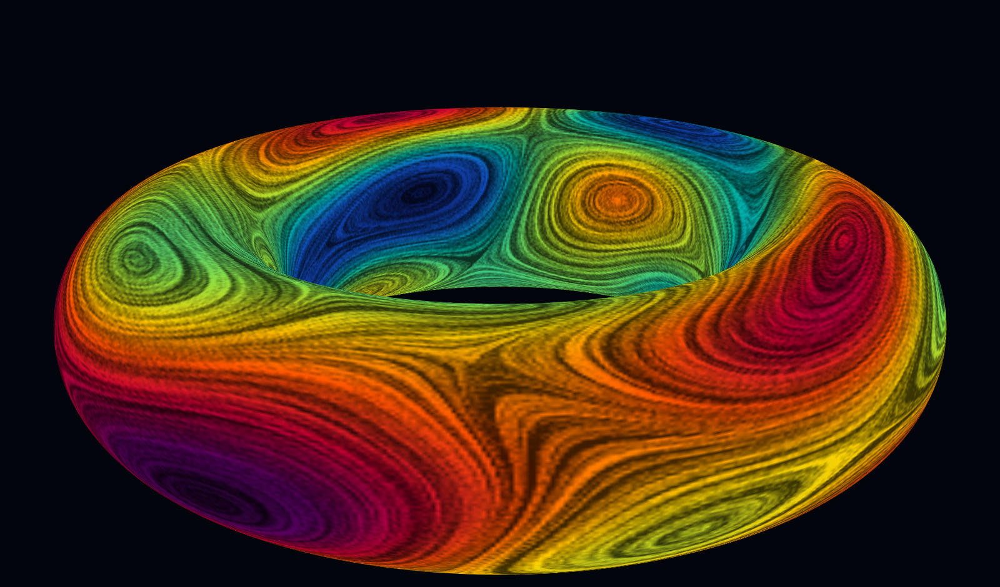

In [4]:
R_tor, r_tor = 3.0, 1.0
N_U_T, N_V_T = 800, 320  # toroidal, poloidal

u_t = np.linspace(0, 2 * np.pi, N_U_T, endpoint=False)
v_t = np.linspace(0, 2 * np.pi, N_V_T, endpoint=False)
U_t, V_t = np.meshgrid(u_t, v_t)  # (N_V_T, N_U_T)

# ── Stream function: multiple Fourier modes → rich vortex field ────────────
psi = (
    2.0 * np.sin(2 * U_t) * np.cos(2 * V_t) +
    1.3 * np.cos(3 * U_t + 0.5) * np.sin(3 * V_t) +
    0.7 * np.sin(5 * U_t - 0.8) * np.cos(V_t + 0.3) +
    0.5 * np.cos(U_t + 0.4) * np.sin(4 * V_t) +
    0.35 * np.sin(4 * U_t + 1.1) * np.cos(4 * V_t - 0.5)
)

dpsi_dU = np.gradient(psi, u_t, axis=1)
dpsi_dV = np.gradient(psi, v_t, axis=0)
uf_tor = dpsi_dV  * (N_U_T / (2 * np.pi))
vf_tor = -dpsi_dU * (N_V_T / (2 * np.pi))

psi_norm = (psi - psi.min()) / (psi.max() - psi.min() + 1e-10)
rad_norm = (1.0 + np.cos(V_t)) / 2.0
col_norm = 0.65 * psi_norm + 0.35 * rad_norm

TORUS_CMAP = LinearSegmentedColormap.from_list(
    "torus_vortex",
    ["#030818", "#0d1f6e", "#1255cc", "#00b8aa", "#90e040",
     "#ffd000", "#ff5500", "#cc0033", "#5a0060", "#030818"],
)

# ── LIC in UV space with periodic wrapping ─────────────────────────────────
rng_tor = np.random.default_rng(42)
noise_t = rng_tor.uniform(0, 1, (N_V_T, N_U_T)).astype(np.float32)


def bilerp_torus(img, pu, pv_a, NU, NV):
    u0 = pu.astype(np.int32) % NU
    u1 = (u0 + 1) % NU
    v0 = pv_a.astype(np.int32) % NV
    v1 = (v0 + 1) % NV
    fu = np.clip(pu - pu.astype(np.int32), 0.0, 1.0)
    fv = np.clip(pv_a - pv_a.astype(np.int32), 0.0, 1.0)
    return (img[v0, u0] * (1 - fu) * (1 - fv) + img[v0, u1] * fu * (1 - fv) +
            img[v1, u0] * (1 - fu) * fv       + img[v1, u1] * fu * fv)


spd_t = np.sqrt(uf_tor ** 2 + vf_tor ** 2) + 1e-10
un_t, vn_t = uf_tor / spd_t, vf_tor / spd_t

STEPS_T = 60
result_t = noise_t.copy()
weight_t = np.ones_like(noise_t)
for _dir in [1, -1]:
    pu   = np.tile(np.arange(N_U_T, dtype=np.float32), (N_V_T, 1))
    pv_c = np.tile(np.arange(N_V_T, dtype=np.float32), (N_U_T, 1)).T
    for _s in range(STEPS_T):
        iu = pu.astype(np.int32) % N_U_T
        iv = pv_c.astype(np.int32) % N_V_T
        _w = 1.0 - _s / STEPS_T
        result_t += _w * bilerp_torus(noise_t, pu, pv_c, N_U_T, N_V_T)
        weight_t += _w
        pu   = (pu   + _dir * un_t[iv, iu]) % N_U_T
        pv_c = (pv_c + _dir * vn_t[iv, iu]) % N_V_T

lic_t = result_t / weight_t
lo_t, hi_t = np.percentile(lic_t, 3), np.percentile(lic_t, 97)
lic_t = np.clip((lic_t - lo_t) / (hi_t - lo_t + 1e-10), 0, 1)

tor_rgb = TORUS_CMAP(col_norm)[:, :, :3]
tor_colored = tor_rgb * (0.25 + 0.75 * lic_t[:, :, None])
tor_img = (np.clip(tor_colored, 0, 1) * 255).astype(np.uint8)
tor_tex = pv.numpy_to_texture(tor_img)
tor_tex.InterpolateOn()

# ── Seam-free torus: duplicate vertices at both wrap boundaries ────────────
# (nu+1) × (nv+1) grid so closing faces interpolate [s≈1, s=1] not [s≈1, s=0]
nu, nv = N_U_T, N_V_T
u_cl = np.linspace(0, 2 * np.pi, nu + 1)   # includes endpoint = 2π ≡ 0
v_cl = np.linspace(0, 2 * np.pi, nv + 1)
U_c, V_c = np.meshgrid(u_cl, v_cl, indexing="ij")  # (nu+1, nv+1)

X_tor = (R_tor + r_tor * np.cos(V_c)) * np.cos(U_c)
Y_tor = (R_tor + r_tor * np.cos(V_c)) * np.sin(U_c)
Z_tor = r_tor * np.sin(V_c)
points = np.column_stack([X_tor.ravel(), Y_tor.ravel(), Z_tor.ravel()])

# Texture coords increase monotonically — no jump at the seam
tc_s = (U_c / (2 * np.pi)).ravel()   # 0 → 1
tc_t = (V_c / (2 * np.pi)).ravel()   # 0 → 1

II, JJ = np.meshgrid(np.arange(nu), np.arange(nv), indexing="ij")
stride = nv + 1
p0 = (II * stride + JJ).ravel()
p1 = ((II + 1) * stride + JJ).ravel()
p2 = ((II + 1) * stride + JJ + 1).ravel()
p3 = (II * stride + JJ + 1).ravel()
faces = np.column_stack([np.full(nu * nv, 4), p0, p1, p2, p3]).ravel()

torus_poly = pv.PolyData(points, faces)
torus_poly.active_texture_coordinates = np.column_stack([tc_s, tc_t])

ps = pv.Plotter(off_screen=True, window_size=(1600, 940))
ps.set_background("#02050b")
ps.add_mesh(torus_poly, texture=tor_tex, lighting=False)
ps.camera_position = [(0, -13, 5), (0, 0, 0), (0, 0, 1)]
ps.camera.zoom(1.35)
SURFACE_PNG = Path("karman_surface_lic.png")
_ = ps.show(screenshot=str(SURFACE_PNG), jupyter_backend="none")
display(Image(filename=str(SURFACE_PNG)))
